In [1]:
from IPython.display import display
from IPython.display import Latex
import blosc
import matplotlib
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pytz
import pickle
import os
import pandas as pd
from platform import python_version

if python_version().startswith('3.7'):
    import pickle5 as pickle

FSIZE = "full" #"tiny", "small" or "full"

fdir = os.path.join('pickles', 'temporal_analysis')
os.makedirs(fdir, exist_ok = True)

with open(os.path.join(fdir, f'decomposition-runtime-{FSIZE}-hourly.pc'), 'rb') as f:
    decomp_hourly = pickle.loads(blosc.decompress(f.read()))

with open(os.path.join(fdir, f'decomposition-runtime-{FSIZE}-daily.pc'), 'rb') as f:
    decomp_daily = pickle.loads(blosc.decompress(f.read()))

In [2]:
from notebook_shared import decomposeutils as dcu
from notebook_shared import utils
from notebook_shared import violinplotutil

import seaborn as sns
sns.set()
matplotlib.style.use('seaborn-colorblind')

In [3]:
def get_decomposition_data(decomp, col='observed'):
    if col == 'observed':
        series = getattr(decomp['data'], col)['runtime'].rename(col)
    else:
        series = getattr(decomp['data'], col).rename(col)
    return series

In [4]:
def convert_decomp_series_to_df(series, timezone = None, strftime = None):
        
        df = pd.DataFrame(series)
        df.set_index(pd.DatetimeIndex(df.index), drop=False, inplace=False)
        if (timezone is not None):
            df['hist'] = df.index.tz_localize('UTC').tz_convert(timezone).strftime(strftime)
        else:
            df['hist'] = df.index.tz_localize('UTC').strftime(strftime)
        return df

In [5]:
def boxplot_hourly(data, ax, title, col='seasonal'):
    fdf = None
    for decomp in data:
        timezone = decomp['parameters']['timezone']
        region = decomp['parameters']['region']
        series = get_decomposition_data(decomp['decomposition'], col)
        df = convert_decomp_series_to_df(series, timezone, '%H')
        
        if fdf is None:
            fdf = df
        else:
            fdf = fdf.append(df)  
    
    bxp = fdf.boxplot(col, by='hist', showfliers=False, ax=ax)
    
    ax.set_title(title)
    ax.set_xlabel('')
    
    data = fdf[["hist", col]].groupby(by='hist')[col].describe()
    return data

In [6]:
def boxplot_daily(data, ax, title, col='seasonal'):
    fdf = None
    for decomp in data:
        timezone = decomp['parameters']['timezone']
        region = decomp['parameters']['region']
        
        if col == 'observed':
            series = getattr(decomp['decomposition']['data'], col)['runtime'].rename(col)
        else:
            series = getattr(decomp['decomposition']['data'], col).rename(col)
        
        df = pd.DataFrame(series)
        df.set_index(pd.DatetimeIndex(df.index), drop=False, inplace=False)
        df['hist'] = df.index.tz_localize('UTC').tz_convert(timezone).strftime("%w")
    
        if fdf is None:
            fdf = df
        else:
            fdf = fdf.append(df)  
    fdf['hist'] = fdf['hist'].replace('0', '7')
    
    bxp = fdf.boxplot(col, by='hist', showfliers=False, ax=ax)
    ax.set_title(title)
    ax.set_xlabel('')
    
    data = fdf[["hist", col]].groupby(by='hist')[col].describe()
    return data

In [7]:
def violinplot_hourly(data, ax, title, col='seasonal'):
    fdf = None
    for decomp in data:
        timezone = decomp['parameters']['timezone']
        region = decomp['parameters']['region']
        
        if col == 'observed':
            series = getattr(decomp['decomposition']['data'], col)['runtime'].rename(col)
            series = series.astype(np.float64) #TODO: check if fix neccesary for vio (box not)
        else:
            series = getattr(decomp['decomposition']['data'], col).rename(col)
        
        df = pd.DataFrame(series)
        df.set_index(pd.DatetimeIndex(df.index), drop=False, inplace=False)
        df['hist'] = df.index.tz_localize('UTC').tz_convert(timezone).strftime("%H")

        if fdf is None:
            fdf = df
        else:
            fdf = fdf.append(df)  
    
    fdf = fdf.sort_values(by=['hist', col])
    ax = violinplotutil.violinplot(x="hist", y=col, cut=0, data=fdf, ax=ax, inner='box', rot=45, linewidth=0.1, customlineswidth=1.5)
    
    ax.set_title(title)
    ax.set_xlabel('')
    
    # Set better default lims:
    data = fdf[["hist", col]].groupby(by='hist')[col].describe()
    i25 = data['25%'].min()
    i75 = data['75%'].max()
    
    iqr = (i75 - i25)
    whisker_lim = 1.5 * iqr
    ax.set_ylim(i25 - whisker_lim , i75 + whisker_lim)
    return data

In [8]:
def violinplot_daily(data, ax, title, col='seasonal'):
    fdf = None
    for decomp in data:
        timezone = decomp['parameters']['timezone']
        region = decomp['parameters']['region']
        
        if col == 'observed':
            series = getattr(decomp['decomposition']['data'], col)['runtime'].rename(col)
            series = series.astype(np.float64) #TODO: check if fix neccesary for vio (box not)
        else:
            series = getattr(decomp['decomposition']['data'], col).rename(col)
        
        df = pd.DataFrame(series)
        df.set_index(pd.DatetimeIndex(df.index), drop=False, inplace=False)
        df['hist'] = df.index.tz_localize('UTC').tz_convert(timezone).strftime("%w")
    
        if fdf is None:
            fdf = df
        else:
            fdf = fdf.append(df)
    
    fdf['hist'] = fdf['hist'].replace('0', '7')
    
    fdf = fdf.sort_values(by=['hist', col])
    ax = violinplotutil.violinplot(x="hist", y=col, cut=0, data=fdf, ax=ax, inner='box', rot=45, linewidth=0.1, customlineswidth=1.5)
    
    ax.set_title(title)
    ax.set_xlabel('')
    
    # Set better default lims:
    data = fdf[["hist", col]].groupby(by='hist')[col].describe()
    i25 = data['25%'].min()
    i75 = data['75%'].max()
    
    iqr = (i75 - i25)
    whisker_lim = 1.5 * iqr
    ax.set_ylim(i25 - whisker_lim , i75 + whisker_lim)
    return data

In [9]:
def get_normalized_series(series, new_name):
    series = series.rename(new_name)
    # Normalize Series
    normalized_series = (series-series.min()) / (series.max() - series.min())
    return normalized_series

In [10]:
def join_decompositions(decompositions, with_tz = True, strftime='%H', col='observed'):
    
    full_dataset = None
    
    for decomp in decompositions:
        timezone = None
        if with_tz:
            timezone = decomp['parameters']['timezone']
        
        region = decomp['parameters']['region']
        provider = decomp['parameters']['provider']
        
        series = get_decomposition_data(decomp['decomposition'], col)
        
        df = convert_decomp_series_to_df(series, timezone, strftime) 
        df['region'] = region
        df['timezone'] = timezone
        df['provider'] = provider
        
        if full_dataset is None:
            full_dataset = df
        else:
            full_dataset = full_dataset.append(df)
    
    return full_dataset

In [11]:
def get_heatmap_dataset(provider, with_tz, col, decomp, strftime, with_regions=True, data_col='50%'):
    
    decomp = list(filter(lambda decomp: decomp['parameters']['provider'] == provider, decomp))
    
    df = join_decompositions(decomp, with_tz=with_tz, strftime=strftime, col=col)
    
    normalized_series = []
    data_series = []
    normalized_series.append(get_normalized_series(df.groupby(['hist'])[col].describe()[data_col], f'{provider}'))
    data_series.append(df.groupby(['hist'])[col].describe()[data_col].rename(f'{provider}'))
    
    if with_regions:
        for region in list(df['region'].unique()):
                region_df = df[df['region'] == region]
                normalized_series.append(get_normalized_series(region_df.groupby(['hist'])[col].describe()[data_col], f'{region}'))
                data_series.append(region_df.groupby(['hist'])[col].describe()[data_col].rename(f'{region}'))

    ndf = pd.concat(normalized_series, axis=1)
    ddf = pd.concat(data_series, axis=1)
        
    return {'normalized_df': ndf.transpose(), 'data_df': ddf.transpose() }

In [12]:
aws_hourly_decomposes = list(filter(lambda decomp: decomp['parameters']['provider'] == "AWS", decomp_hourly))
azure_hourly_decomposes = list(filter(lambda decomp: decomp['parameters']['provider'] == "AZURE", decomp_hourly))
gcp_hourly_decomposes = list(filter(lambda decomp: decomp['parameters']['provider'] == "GCP", decomp_hourly))

aws_daily_decomposes = list(filter(lambda decomp: decomp['parameters']['provider'] == "AWS", decomp_daily))
azure_daily_decomposes = list(filter(lambda decomp: decomp['parameters']['provider'] == "AZURE", decomp_daily))
gcp_daily_decomposes = list(filter(lambda decomp: decomp['parameters']['provider'] == "GCP", decomp_daily))

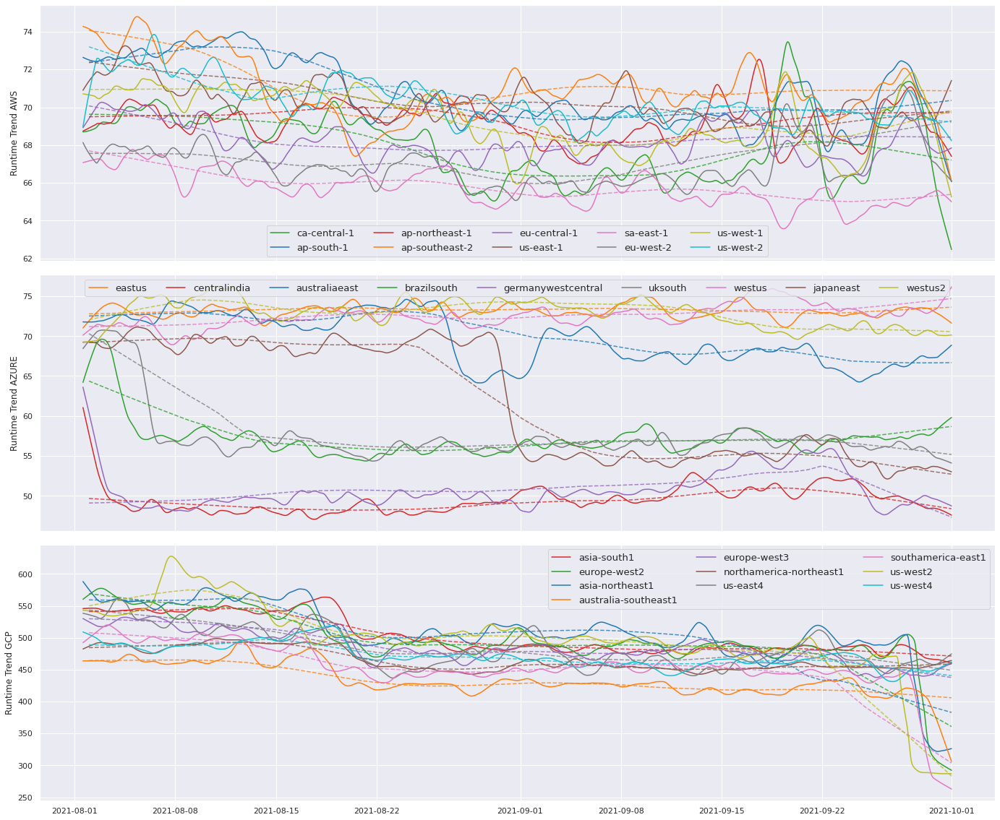

In [13]:
fig, axis = plt.subplots(figsize=(20,16), nrows=3, sharex=True)
sns.set(font_scale=1.2)
ax = axis[0]
for decomp in aws_hourly_decomposes:
    region = decomp['parameters']['region']
    x= decomp['decomposition']['data'].trend
    ax.plot(x, label=region, color=utils.provider_region_colors(region))
    
for decomp in aws_daily_decomposes:
    region = decomp['parameters']['region']
    x= decomp['decomposition']['data'].trend
    ax.plot(x, linestyle='dashed', color=utils.provider_region_colors(region), alpha=0.8)
    
leg = ax.legend(ncol=5, loc='lower center')
ax.set_ylabel('Runtime Trend AWS')

ax = axis[1]
for decomp in azure_hourly_decomposes:
    region = decomp['parameters']['region']
    x= decomp['decomposition']['data'].trend
    ax.plot(x, label=region, color=utils.provider_region_colors(region))
for decomp in azure_daily_decomposes:
    region = decomp['parameters']['region']
    x= decomp['decomposition']['data'].trend
    ax.plot(x, linestyle='dashed', color=utils.provider_region_colors(region), alpha=0.8)
ax.set_ylabel('Runtime Trend AZURE')
leg = ax.legend(ncol=10, loc='upper center')

ax = axis[2]
for decomp in gcp_hourly_decomposes:
    region = decomp['parameters']['region']
    x= decomp['decomposition']['data'].trend
    ax.plot(x, label=region, color=utils.provider_region_colors(region))
for decomp in gcp_daily_decomposes:
    region = decomp['parameters']['region']
    x= decomp['decomposition']['data'].trend
    ax.plot(x, linestyle='dashed', color=utils.provider_region_colors(region), alpha=0.8)
ax.set_ylabel('Runtime Trend GCP')

leg = ax.legend(ncol=3, loc='upper right')
fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', 'runtime_trend_overview'])

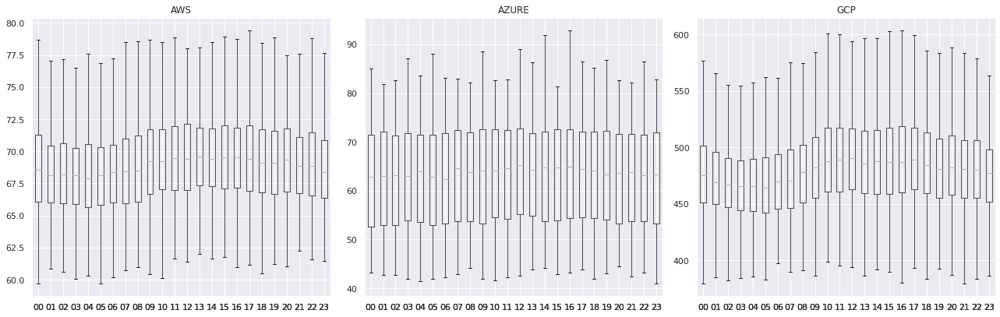

In [14]:
sns.set(font_scale=1)    
fig, ax = plt.subplots(figsize=(18,6), sharex=True, ncols=3)

bxpaws   = boxplot_hourly(aws_hourly_decomposes, ax[0], 'AWS', 'observed')
bxpazure = boxplot_hourly(azure_hourly_decomposes, ax[1], 'AZURE', 'observed')
bxpgcp   = boxplot_hourly(gcp_hourly_decomposes, ax[2], 'GCP', 'observed')
fig.suptitle('')
fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', 'runtime_observed_hourly_overview'],
             bxpaws=bxpaws,
             bxpazure=bxpazure,
             bxpgcp=bxpgcp)

In [15]:
def plot_heatmap(dataset, ax, with_normalized_value=False, cbar=False):
    
    label_df = dataset['data_df'].round(1)
    if with_normalized_value:
        label_df = dataset['normalized_df'].combine(
            dataset['data_df'],
            lambda x,y: x.round(1).astype('string') + '\n (' + y.round(1).astype(str) + ')'
        )

    ax = sns.heatmap(tdf['normalized_df'], annot=label_df, fmt="", linewidths=.5, ax=ax, cbar=cbar, cmap="Reds", center=0.5)
    return ax

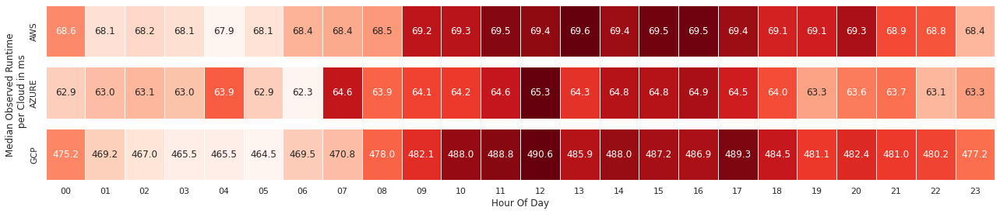

In [16]:
col = 'observed'
with_tz = True
strftime = '%H'
hm_decomp = decomp_hourly
x_label = 'Hour Of Day'
fig, axes = plt.subplots(figsize=(18,4), sharex=True, nrows=3)

# AWS
ax = axes[0]
provider = 'AWS'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime, with_regions=False)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')

# AZURE
ax = axes[1]
provider = 'AZURE'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime, with_regions=False)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')
ax.set_ylabel('Median Observed Runtime \n per Cloud in ms')

# GCP
ax = axes[2]
provider = 'GCP'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime, with_regions=False)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel(x_label)

fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', f'heatmap_hourly_{col}_runtime_global_only'])

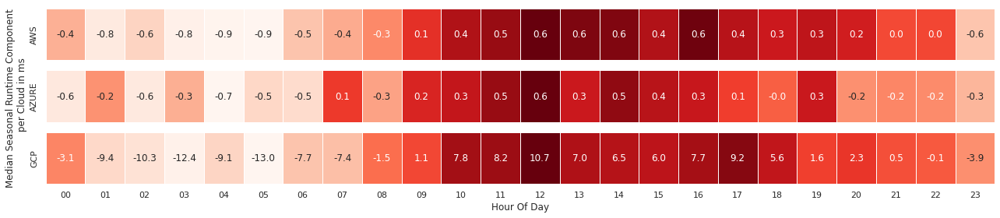

In [17]:
col = 'seasonal'
with_tz = True
strftime = '%H'
hm_decomp = decomp_hourly
x_label = 'Hour Of Day'
fig, axes = plt.subplots(figsize=(18,4), sharex=True, nrows=3)

# AWS
ax = axes[0]
provider = 'AWS'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime, with_regions=False)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')

# AZURE
ax = axes[1]
provider = 'AZURE'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime, with_regions=False)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')
ax.set_ylabel('Median Seasonal Runtime Component \n per Cloud in ms')

# GCP
ax = axes[2]
provider = 'GCP'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime, with_regions=False)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel(x_label)


fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', f'heatmap_hourly_{col}_runtime_global_only'])

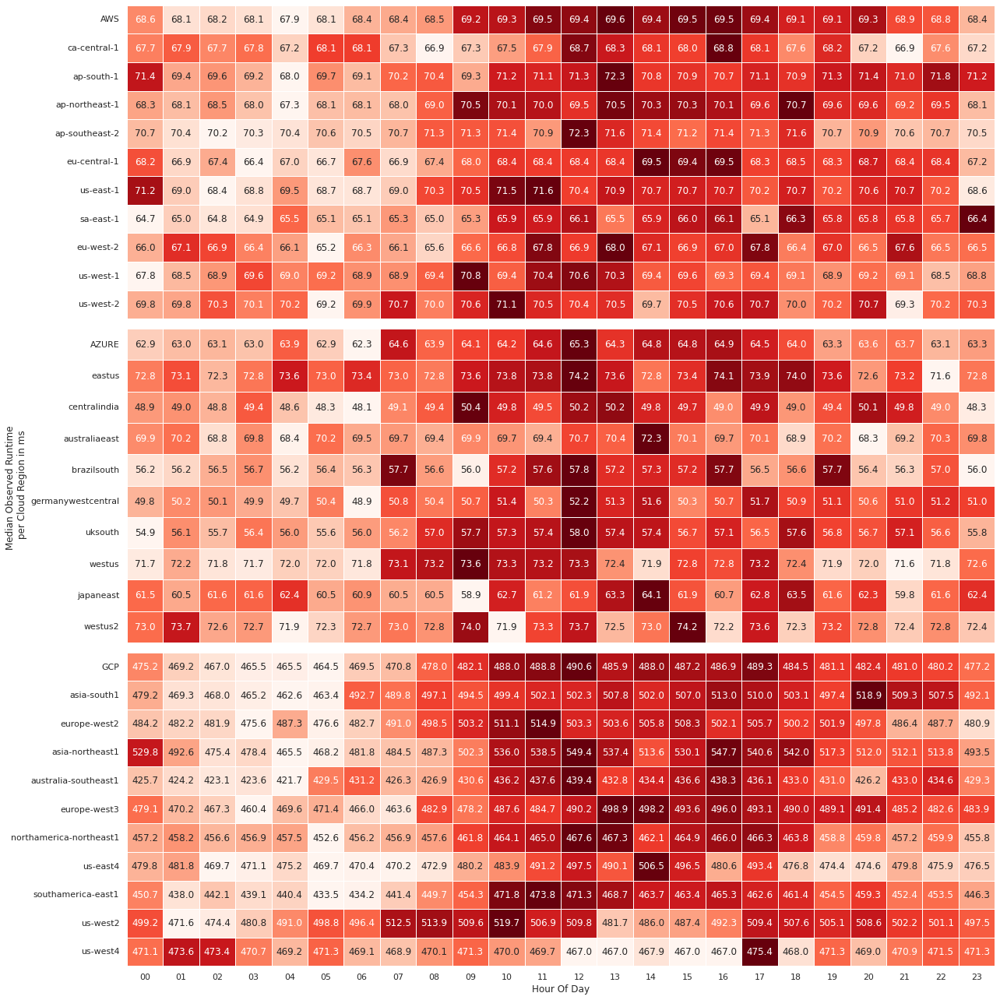

In [18]:
col = 'observed'
with_tz = True
hm_decomp = decomp_hourly
x_label = 'Hour Of Day'
fig, axes = plt.subplots(figsize=(18,18), sharex=True, nrows=3)

# AWS
ax = axes[0]
provider = 'AWS'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')

# AZURE
ax = axes[1]
provider = 'AZURE'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')
ax.set_ylabel('Median Observed Runtime \n per Cloud Region in ms')

# GCP
ax = axes[2]
provider = 'GCP'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel(x_label)

fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', f'heatmap_hourly_{col}_runtime_regional'])

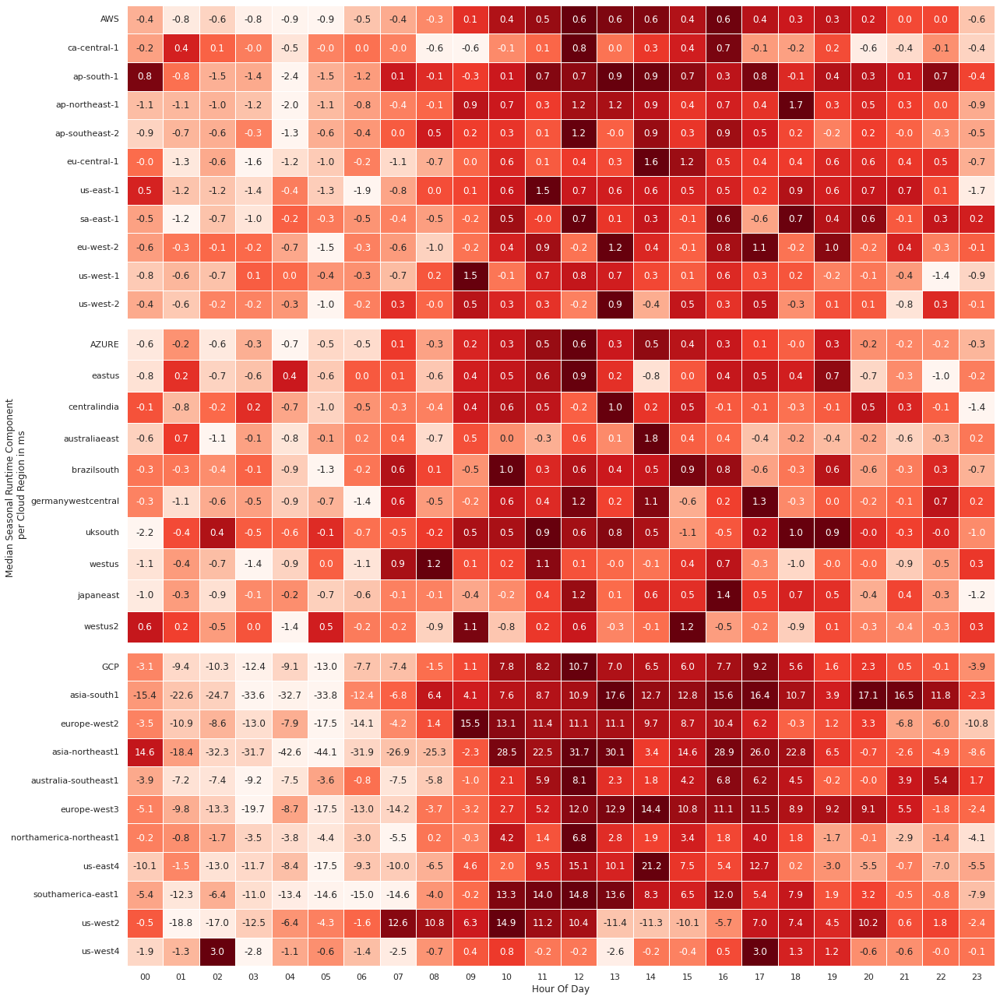

In [19]:
col = 'seasonal'
with_tz = True
hm_decomp = decomp_hourly
x_label = 'Hour Of Day'
fig, axes = plt.subplots(figsize=(18,18), sharex=True, nrows=3)

# AWS
ax = axes[0]
provider = 'AWS'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')

# AZURE
ax = axes[1]
provider = 'AZURE'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')
ax.set_ylabel('Median Seasonal Runtime Component \n per Cloud Region in ms')

# GCP
ax = axes[2]
provider = 'GCP'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel(x_label)

fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', f'heatmap_hourly_{col}_runtime_regional'])

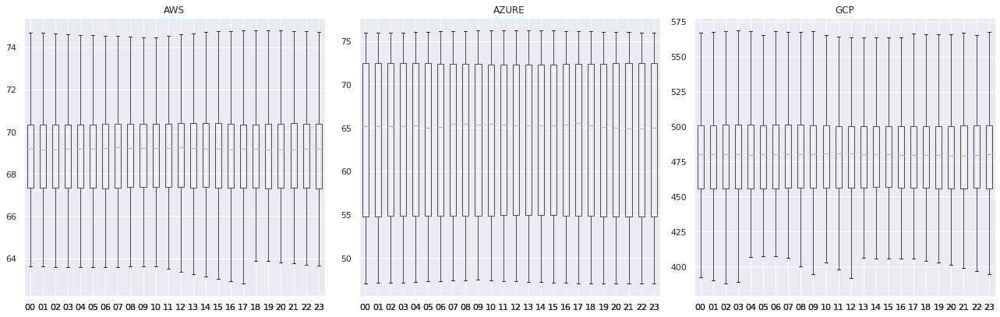

In [20]:
sns.set(font_scale=1)    
fig, ax = plt.subplots(figsize=(18,6), sharex=True, ncols=3)

bxpaws   = boxplot_hourly(aws_hourly_decomposes, ax[0], 'AWS', 'trend')
bxpazure = boxplot_hourly(azure_hourly_decomposes, ax[1], 'AZURE', 'trend')
bxpgcp   = boxplot_hourly(gcp_hourly_decomposes, ax[2], 'GCP', 'trend')
fig.suptitle('')
fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', 'runtime_trend_hourly_overview'],
             bxpaws=bxpaws,
             bxpazure=bxpazure,
             bxpgcp=bxpgcp)

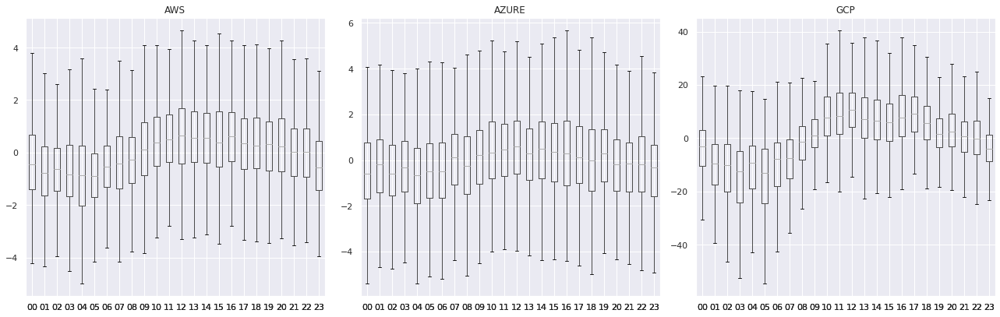

In [21]:
sns.set(font_scale=1)    
fig, ax = plt.subplots(figsize=(18,6), sharex=True, ncols=3)

bxpaws   = boxplot_hourly(aws_hourly_decomposes, ax[0], 'AWS', 'seasonal')
bxpazure = boxplot_hourly(azure_hourly_decomposes, ax[1], 'AZURE', 'seasonal')
bxpgcp   = boxplot_hourly(gcp_hourly_decomposes, ax[2], 'GCP', 'seasonal')
fig.suptitle('')
fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', 'runtime_seasonal_hourly_overview'],
             bxpaws=bxpaws,
             bxpazure=bxpazure,
             bxpgcp=bxpgcp)

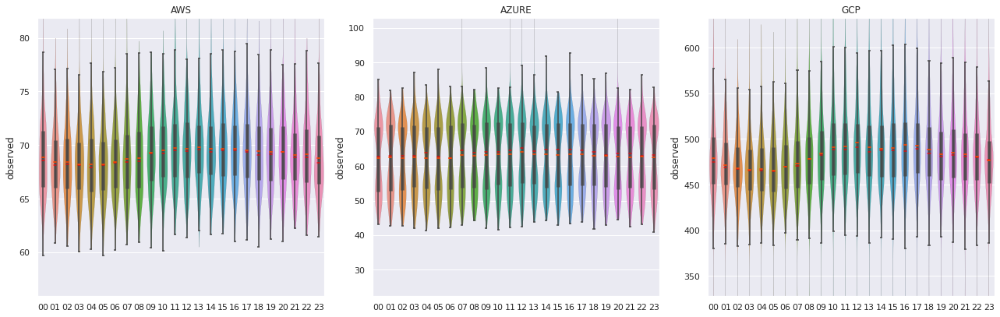

In [22]:
sns.set(font_scale=1)    
fig, ax = plt.subplots(figsize=(18,6), sharex=True, ncols=3)

vioaws   = violinplot_hourly(aws_hourly_decomposes, ax[0], 'AWS', 'observed')
vioazure = violinplot_hourly(azure_hourly_decomposes, ax[1], 'AZURE', 'observed')
viogcp   = violinplot_hourly(gcp_hourly_decomposes, ax[2], 'GCP', 'observed')
fig.suptitle('')
fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', 'runtime_observed_hourly_overview_violin'],
             vioaws=vioaws,
             vioazure=vioazure,
             viogcp=viogcp)

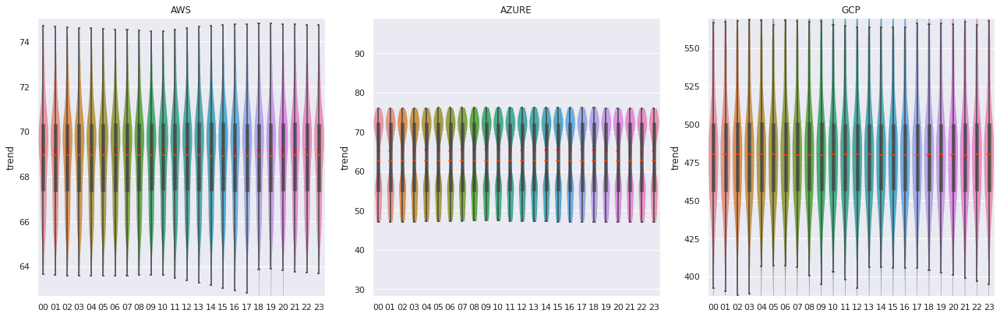

In [23]:
sns.set(font_scale=1)    
fig, ax = plt.subplots(figsize=(18,6), sharex=True, ncols=3)

vioaws   = violinplot_hourly(aws_hourly_decomposes, ax[0], 'AWS', 'trend')
vioazure = violinplot_hourly(azure_hourly_decomposes, ax[1], 'AZURE', 'trend')
viogcp   = violinplot_hourly(gcp_hourly_decomposes, ax[2], 'GCP', 'trend')
fig.suptitle('')
fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', 'runtime_trend_hourly_overview_violin'],
             vioaws=vioaws,
             vioazure=vioazure,
             viogcp=viogcp)

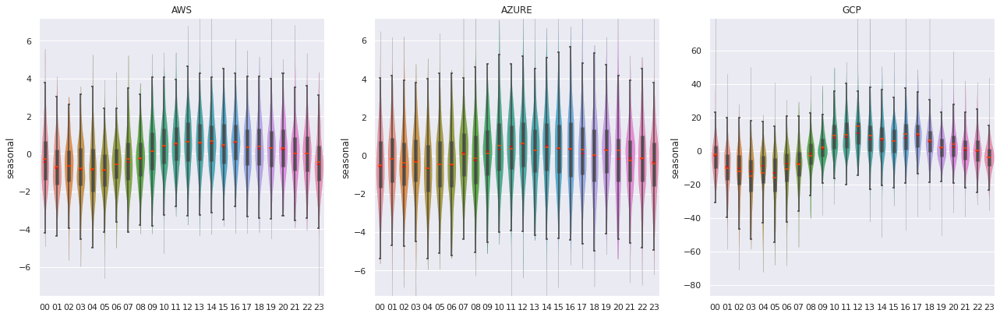

In [24]:
sns.set(font_scale=1)    
fig, ax = plt.subplots(figsize=(18,6), sharex=True, ncols=3)

vioaws   = violinplot_hourly(aws_hourly_decomposes, ax[0], 'AWS', 'seasonal')
vioazure = violinplot_hourly(azure_hourly_decomposes, ax[1], 'AZURE', 'seasonal')
viogcp   = violinplot_hourly(gcp_hourly_decomposes, ax[2], 'GCP', 'seasonal')
fig.suptitle('')
fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', 'runtime_seasonal_hourly_overview_violin'],
             vioaws=vioaws,
             vioazure=vioazure,
             viogcp=viogcp)

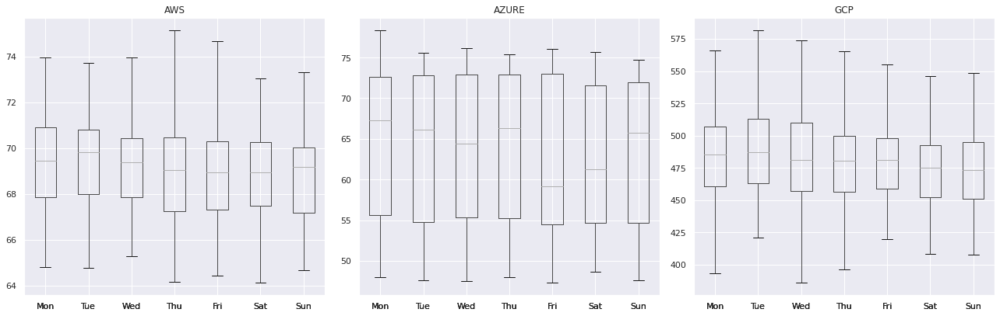

In [25]:
sns.set(font_scale=1)    
fig, ax = plt.subplots(figsize=(18,6), sharex=True, ncols=3)

bxpaws   = boxplot_daily(aws_daily_decomposes,   ax[0], 'AWS', 'observed')
bxpazure = boxplot_daily(azure_daily_decomposes, ax[1], 'AZURE', 'observed')
bxpgcp   = boxplot_daily(gcp_daily_decomposes,   ax[2], 'GCP', 'observed')

# Plot Weekdays
ax[0].set_xticklabels(3*['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])

fig.suptitle('')
fig.tight_layout()
utils.savefig(fig, 
              ['temporal_analysis', 'summary', 'runtime_observed_daily_overview'],
             bxpaws=bxpaws,
             bxpazure=bxpazure,
             bxpgcp=bxpgcp)

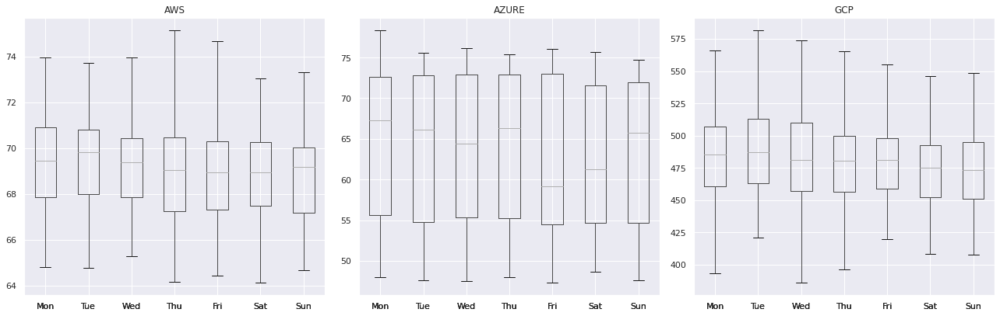

In [26]:
sns.set(font_scale=1)    
fig, ax = plt.subplots(figsize=(18,6), sharex=True, ncols=3)

bxpaws   = boxplot_daily(aws_daily_decomposes,   ax[0], 'AWS', 'observed')
bxpazure = boxplot_daily(azure_daily_decomposes, ax[1], 'AZURE', 'observed')
bxpgcp   = boxplot_daily(gcp_daily_decomposes,   ax[2], 'GCP', 'observed')

# Plot Weekdays
ax[0].set_xticklabels(3*['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])

fig.suptitle('')
fig.tight_layout()
utils.savefig(fig, 
              ['temporal_analysis', 'summary', 'runtime_trend_daily_overview'],
             bxpaws=bxpaws,
             bxpazure=bxpazure,
             bxpgcp=bxpgcp)

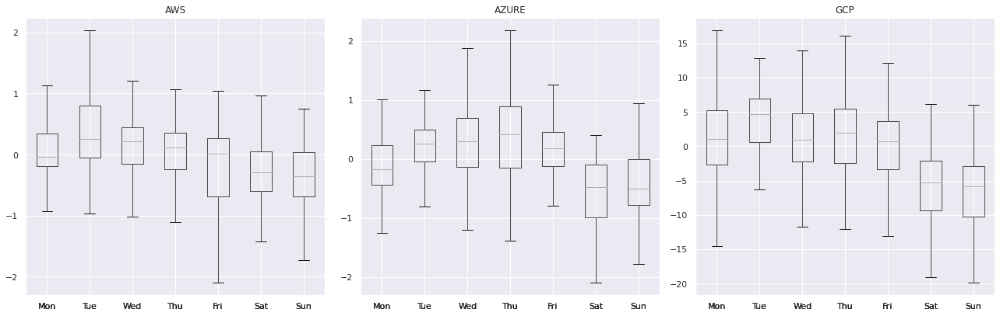

In [27]:
sns.set(font_scale=1)    
fig, ax = plt.subplots(figsize=(18,6), sharex=True, ncols=3)

bxpaws   = boxplot_daily(aws_daily_decomposes,   ax[0], 'AWS', 'seasonal')
bxpazure = boxplot_daily(azure_daily_decomposes, ax[1], 'AZURE', 'seasonal')
bxpgcp   = boxplot_daily(gcp_daily_decomposes,   ax[2], 'GCP', 'seasonal')

# Plot Weekdays
ax[0].set_xticklabels(3*['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])

fig.suptitle('')
fig.tight_layout()
utils.savefig(fig, 
              ['temporal_analysis', 'summary', 'runtime_seasonal_daily_overview'],
             bxpaws=bxpaws,
             bxpazure=bxpazure,
             bxpgcp=bxpgcp)

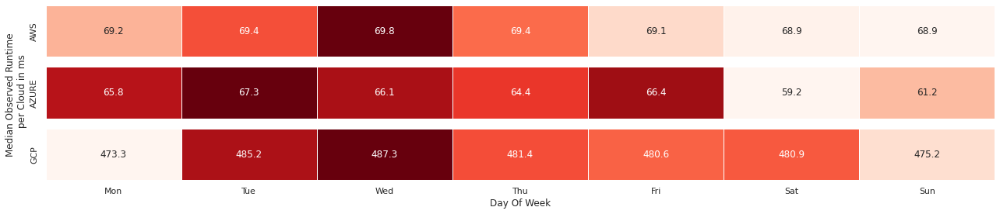

In [28]:
col = 'observed'
with_tz = True
strftime = '%w'
hm_decomp = decomp_daily
x_label = 'Day Of Week'
fig, axes = plt.subplots(figsize=(18,4), sharex=True, nrows=3)

# AWS
ax = axes[0]
provider = 'AWS'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime, with_regions=False)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')

# AZURE
ax = axes[1]
provider = 'AZURE'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime, with_regions=False)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')
ax.set_ylabel('Median Observed Runtime \n per Cloud in ms')

# GCP
ax = axes[2]
provider = 'GCP'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime, with_regions=False)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel(x_label)
ax.set_xticklabels(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])

fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', f'heatmap_daily_{col}_runtime_global_only'])

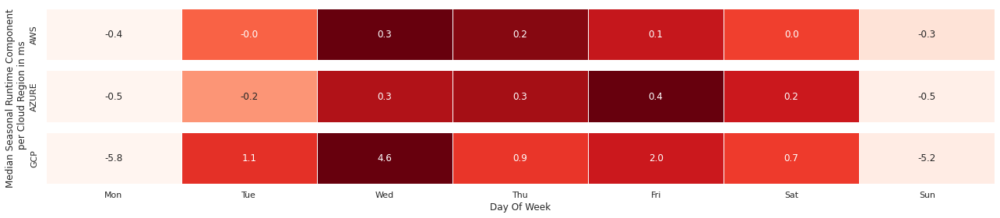

In [29]:
col = 'seasonal'
with_tz = True
strftime = '%w'
hm_decomp = decomp_daily
x_label = 'Day Of Week'
fig, axes = plt.subplots(figsize=(18,4), sharex=True, nrows=3)

# AWS
ax = axes[0]
provider = 'AWS'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime, with_regions=False)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')

# AZURE
ax = axes[1]
provider = 'AZURE'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime, with_regions=False)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')
ax.set_ylabel('Median Seasonal Runtime Component \n per Cloud Region in ms')

# GCP
ax = axes[2]
provider = 'GCP'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime, with_regions=False)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel(x_label)
ax.set_xticklabels(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])

fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', f'heatmap_daily_{col}_runtime_global_only'])

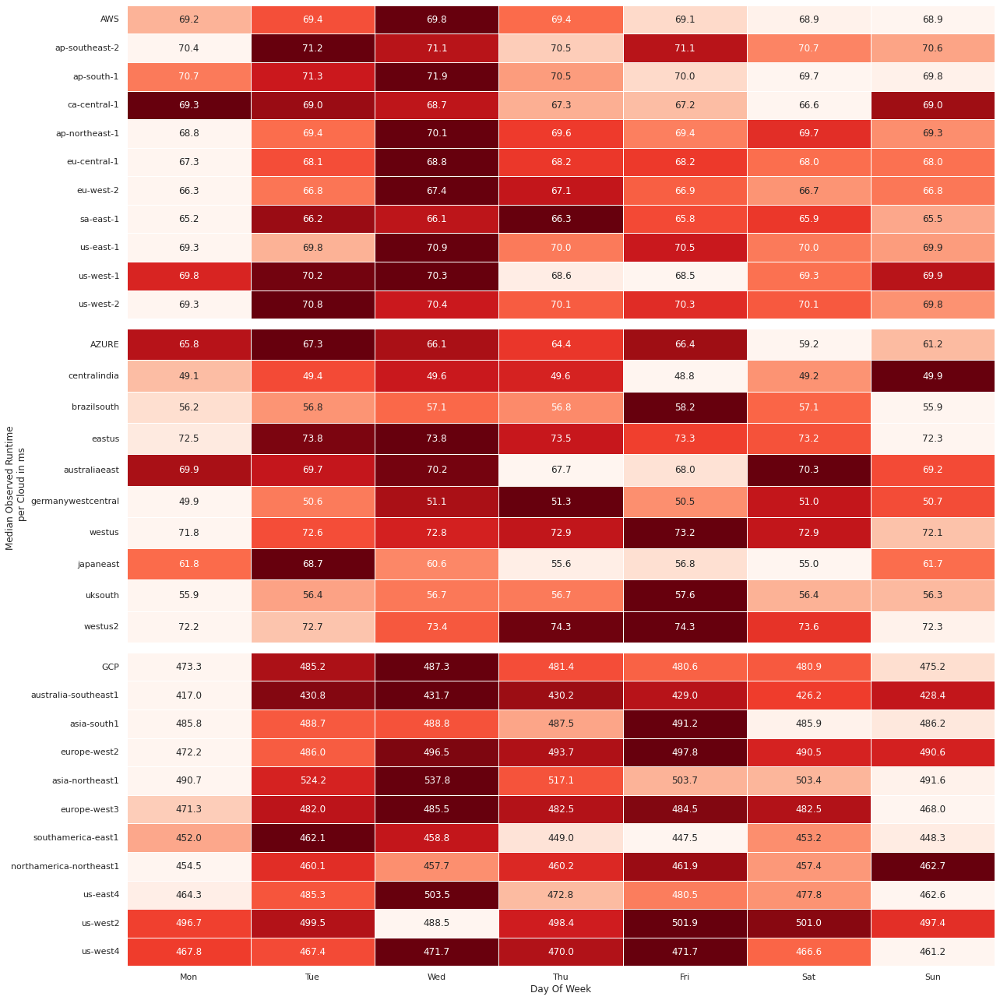

In [30]:
col = 'observed'
with_tz = True
strftime = '%w'
hm_decomp = decomp_daily
x_label = 'Day Of Week'
fig, axes = plt.subplots(figsize=(18,18), sharex=True, nrows=3)

# AWS
ax = axes[0]
provider = 'AWS'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')

# AZURE
ax = axes[1]
provider = 'AZURE'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')
ax.set_ylabel('Median Observed Runtime \n per Cloud in ms')

# GCP
ax = axes[2]
provider = 'GCP'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel(x_label)
ax.set_xticklabels(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])

fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', f'heatmap_daily_{col}_runtime_regional'])

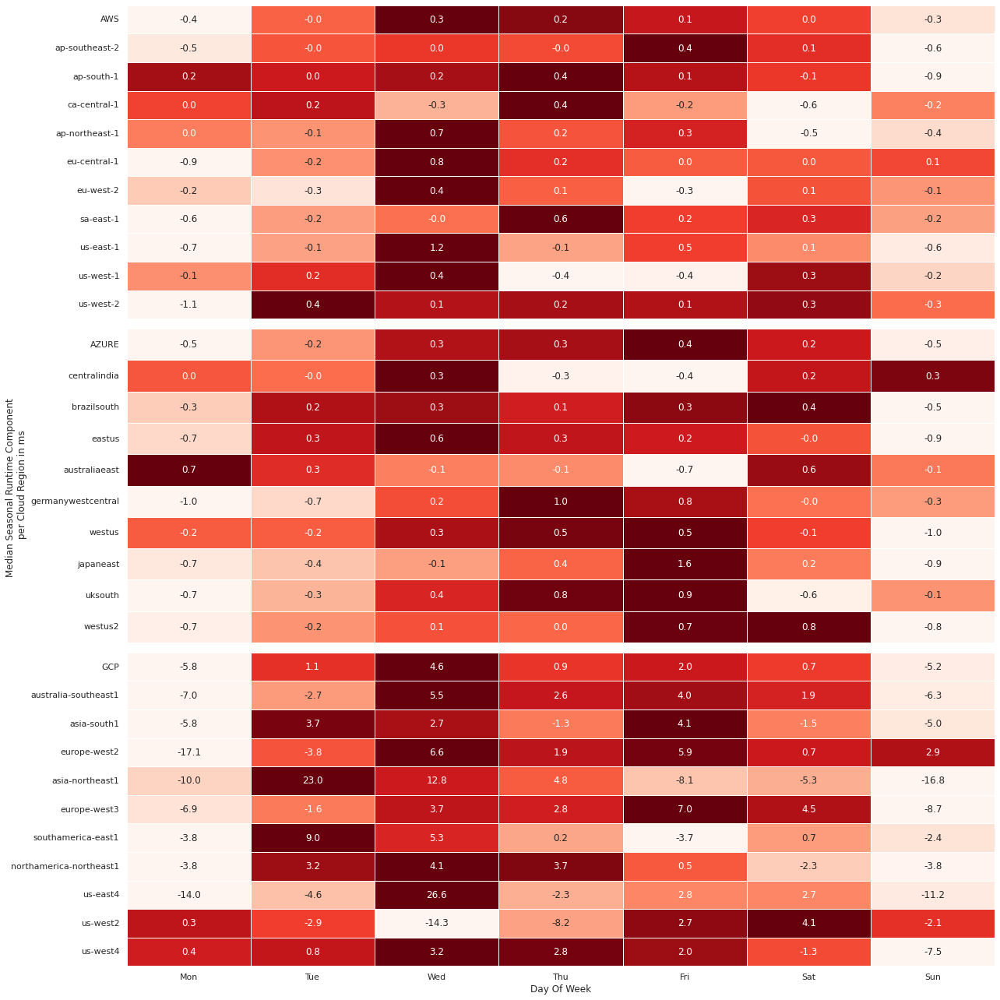

In [31]:
col = 'seasonal'
with_tz = True
strftime = '%w'
hm_decomp = decomp_daily
x_label = 'Day Of Week'
fig, axes = plt.subplots(figsize=(18,18), sharex=True, nrows=3)

# AWS
ax = axes[0]
provider = 'AWS'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')

# AZURE
ax = axes[1]
provider = 'AZURE'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel('')
ax.set_ylabel('Median Seasonal Runtime Component \n per Cloud Region in ms')

# GCP
ax = axes[2]
provider = 'GCP'
tdf = get_heatmap_dataset(provider, with_tz, col, hm_decomp, strftime)
ax = plot_heatmap(tdf, ax)
ax.set_xlabel(x_label)
ax.set_xticklabels(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])

fig.tight_layout()
utils.savefig(fig, ['temporal_analysis', 'summary', f'heatmap_daily_{col}_runtime_regional'])

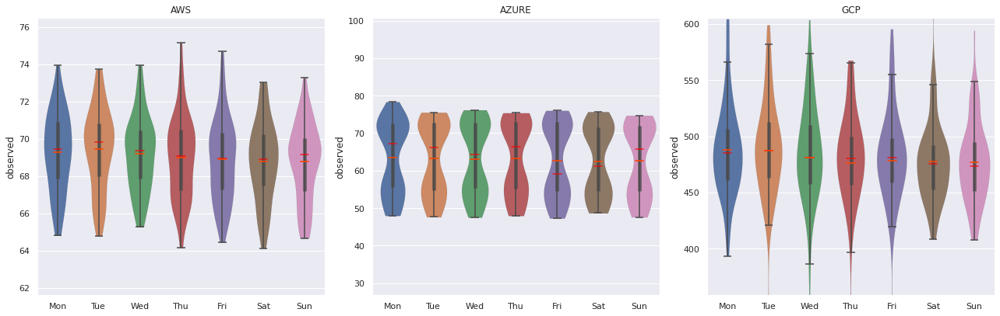

In [32]:
sns.set(font_scale=1)    
fig, ax = plt.subplots(figsize=(18,6), sharex=True, ncols=3)

vioaws =   violinplot_daily(aws_daily_decomposes,   ax[0], 'AWS', 'observed')
vioazure = violinplot_daily(azure_daily_decomposes, ax[1], 'AZURE', 'observed')
viogcp =   violinplot_daily(gcp_daily_decomposes,   ax[2], 'GCP', 'observed')

ax[0].set_xticklabels(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])
fig.suptitle('')
fig.tight_layout()
utils.savefig(fig, 
              ['temporal_analysis', 'summary', 'runtime_observed_daily_overview_violin'],
              vioaws = vioaws,
              vioazure = vioazure,
              viogcp = viogcp)

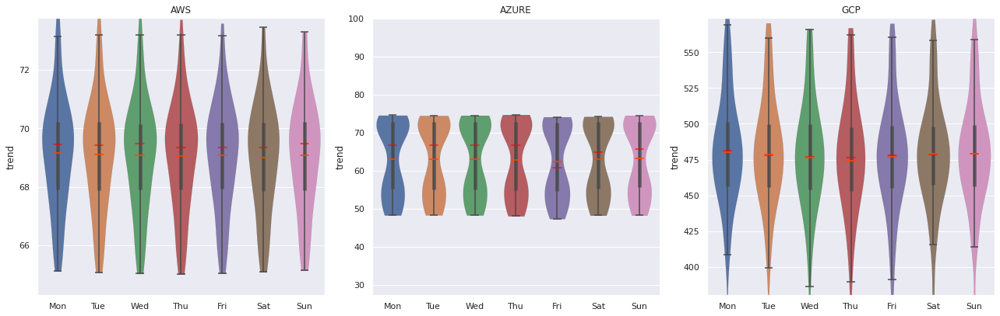

In [33]:
sns.set(font_scale=1)    
fig, ax = plt.subplots(figsize=(18,6), sharex=True, ncols=3)

vioaws =   violinplot_daily(aws_daily_decomposes,   ax[0], 'AWS', 'trend')
vioazure = violinplot_daily(azure_daily_decomposes, ax[1], 'AZURE', 'trend')
viogcp =   violinplot_daily(gcp_daily_decomposes,   ax[2], 'GCP', 'trend')

# Plot Weekdays
ax[0].set_xticklabels(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])

fig.suptitle('')
fig.tight_layout()
utils.savefig(fig, 
              ['temporal_analysis', 'summary', 'runtime_trend_daily_overview_violin'],
              vioaws = vioaws,
              vioazure = vioazure,
              viogcp = viogcp
             )

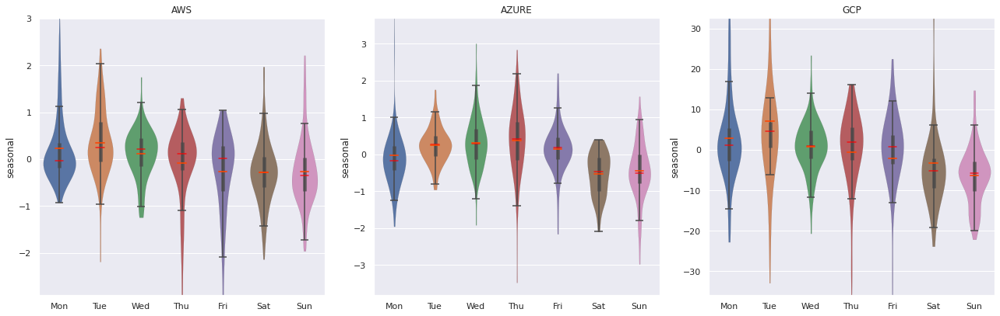

In [34]:
sns.set(font_scale=1)    
fig, ax = plt.subplots(figsize=(18,6), sharex=True, ncols=3)

vioaws =   violinplot_daily(aws_daily_decomposes,   ax[0], 'AWS')
vioazure = violinplot_daily(azure_daily_decomposes, ax[1], 'AZURE')
viogcp =   violinplot_daily(gcp_daily_decomposes,   ax[2], 'GCP')

# Plot Weekdays
ax[0].set_xticklabels(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])

fig.suptitle('')
fig.tight_layout()
utils.savefig(fig, 
              ['temporal_analysis', 'summary', 'runtime_seasonal_daily_overview_violin'],
              vioaws = vioaws,
              vioazure = vioazure,
              viogcp = viogcp
             )

In [35]:
def dict_to_str(dictdata):
    result = ""
    for key, data in dictdata.items():
        result += str(key)
        result += '\n'
        result += str(data)
        result += '\n\n'
    return result

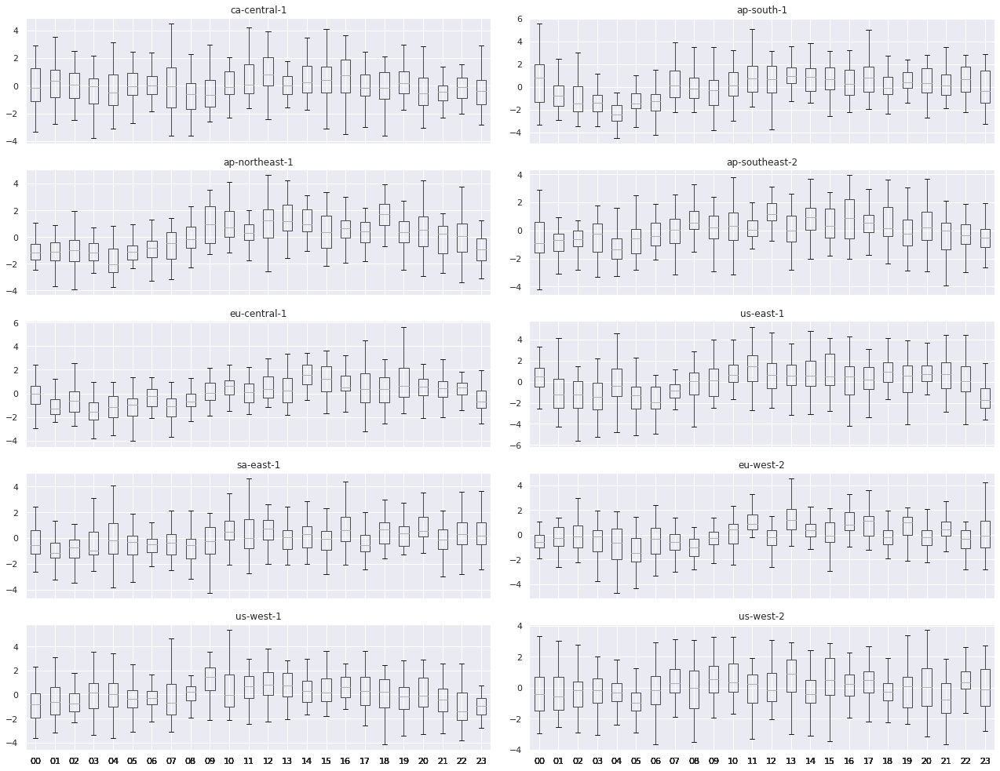

In [36]:
providers = ['AWS'] # , 'AZURE', 'GCP'
cols = ['seasonal'] # 'observed', trend', 'seasonal'

for provider in providers:
    provider_decomposes = list(filter(lambda decomp: decomp['parameters']['provider'] == provider, decomp_hourly))
    
    num_regions = len(provider_decomposes)
    
    for col in cols:
        fig, axis = plt.subplots(figsize=(18,14), sharey=False, sharex=True, nrows = 5, ncols=2)
        from itertools import chain
        axis = list(chain.from_iterable(axis))

        cax = 0
        bxpdata = {}
        for decomp in provider_decomposes:
            bxpdata[decomp['parameters']['region']] = boxplot_hourly([decomp], axis[cax], decomp['parameters']['region'], col)
            cax += 1
        if provider == 'AZURE':
            axis[9].set_facecolor('none')
            axis[9].set_yticks([])
        
        fig.suptitle('')
        fig.tight_layout()
        utils.savefig(fig, ['temporal_analysis', 'summary', provider, f'{col}_runtime_hourly'], bxpdata=dict_to_str(bxpdata))

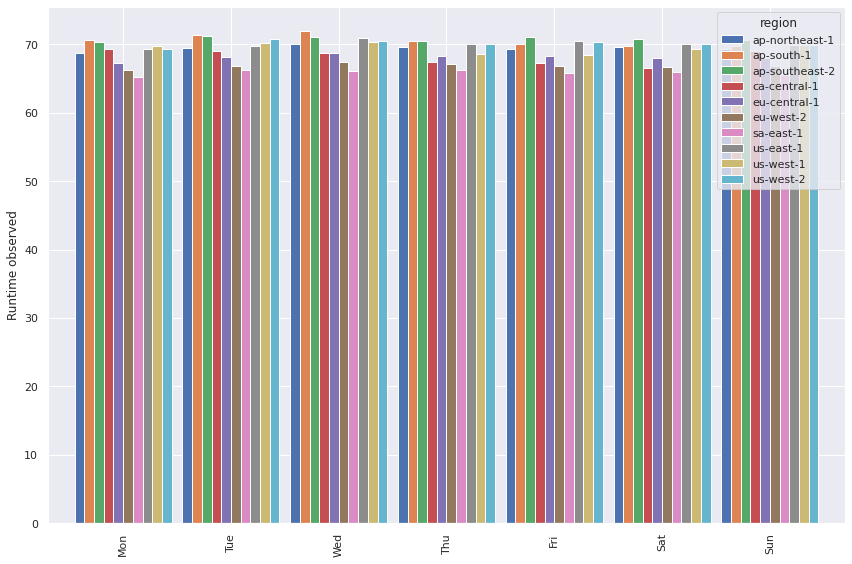

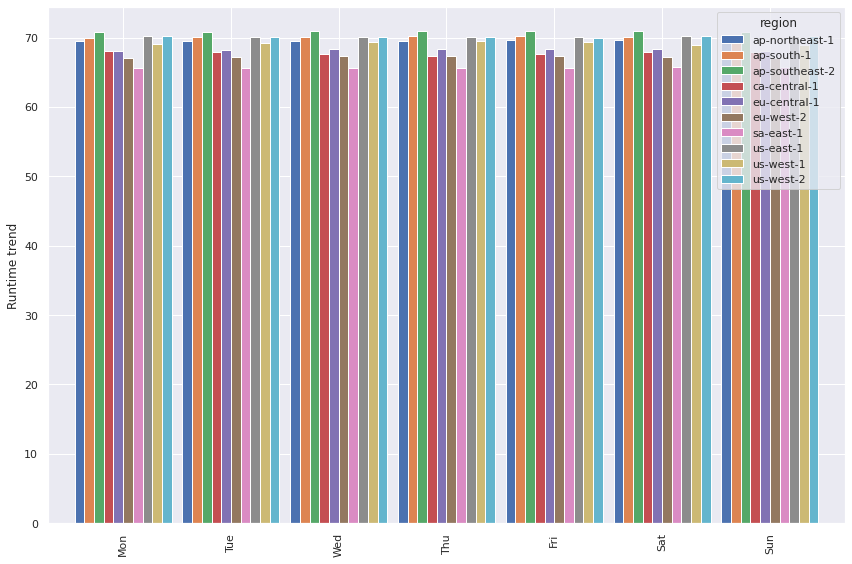

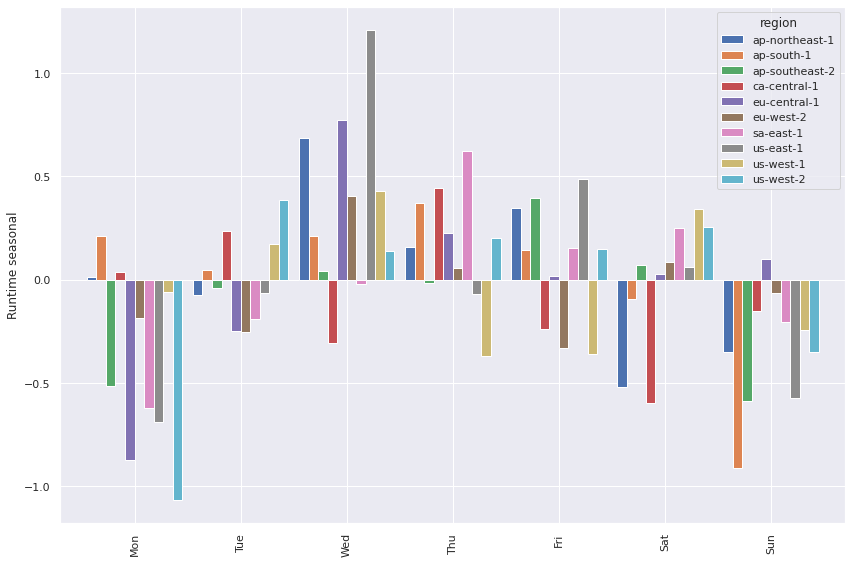

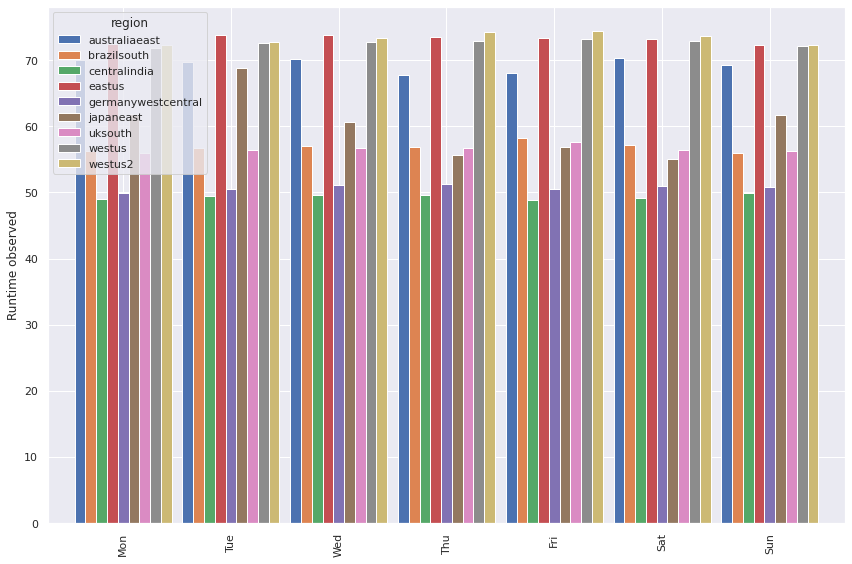

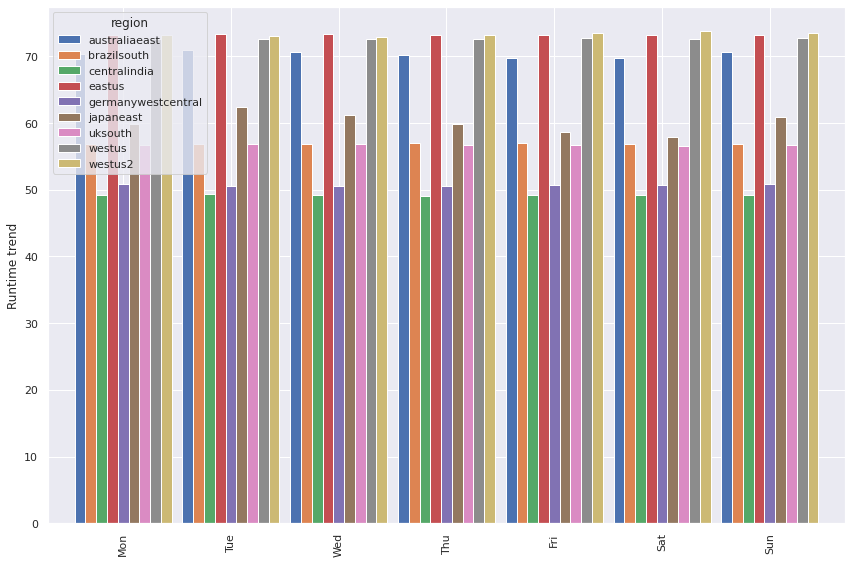

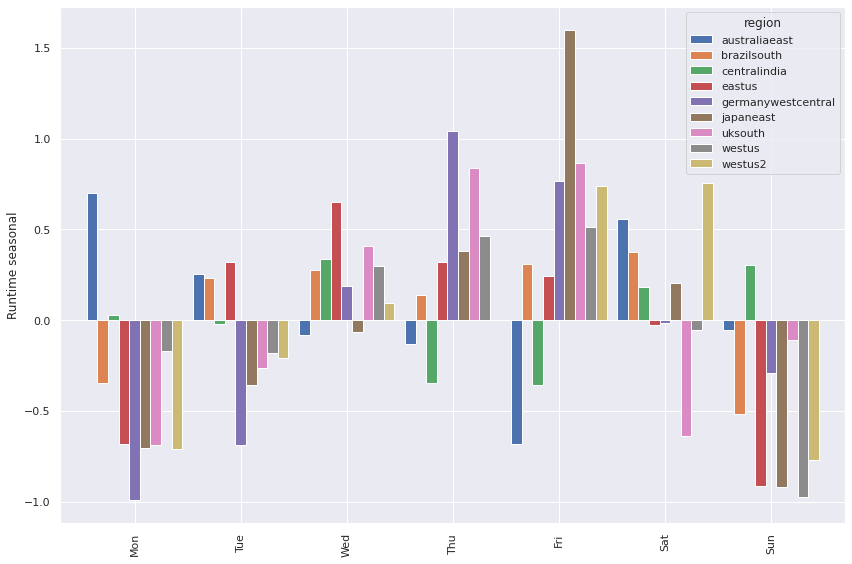

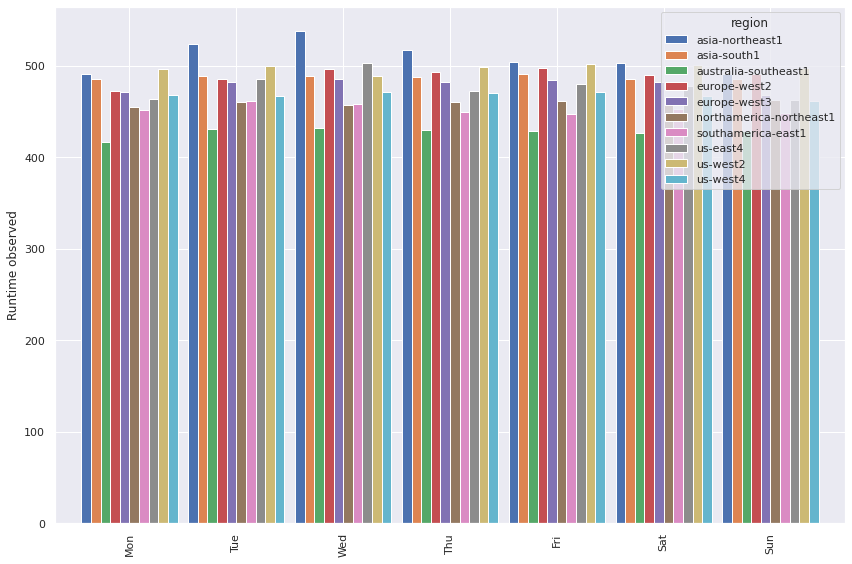

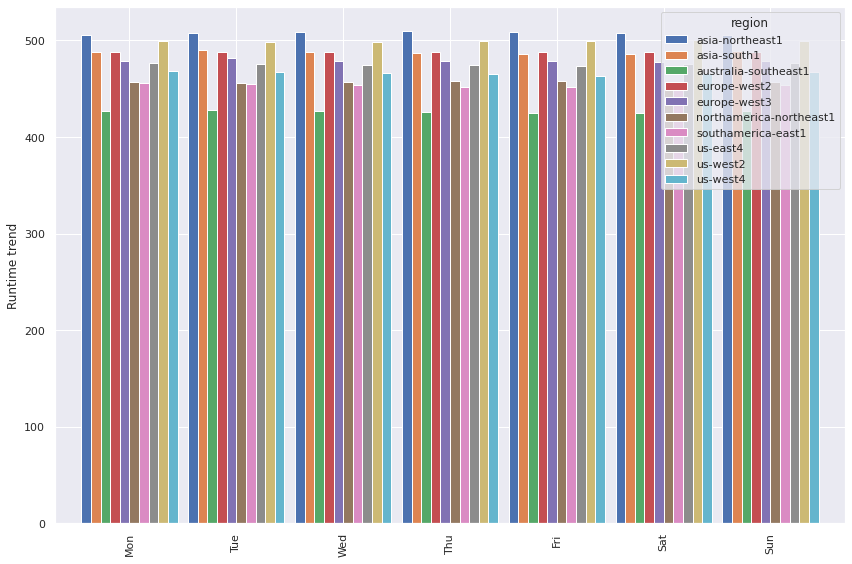

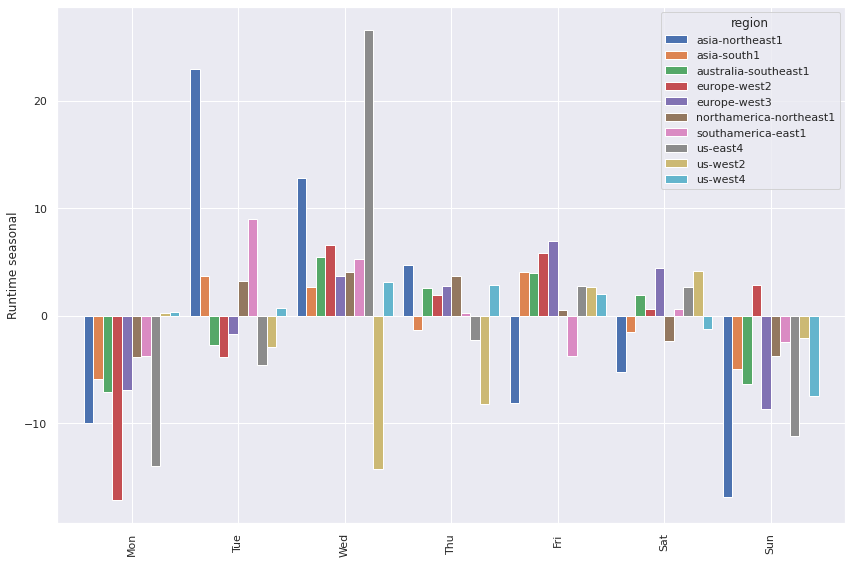

In [37]:
providers = ['AWS', 'AZURE', 'GCP']
cols = ['observed', 'trend', 'seasonal']

for provider in providers:
    provider_decomposes = list(filter(lambda decomp: decomp['parameters']['provider'] == provider, decomp_daily))
    
    num_regions = len(provider_decomposes)
    
    for col in cols:
        fig, axis = plt.subplots(figsize=(12,8), sharey=False, sharex=True, nrows = 1, ncols=1)
        from itertools import chain
        # axis = list(chain.from_iterable(axis))

        #cax = 0
        fdf = None
        for decomp in provider_decomposes:
            timezone = decomp['parameters']['timezone']
            if col == 'observed':
                series = getattr(decomp['decomposition']['data'], col)['runtime'].rename(col)
                series = series.astype(np.float64) #TODO: check if fix neccesary for vio (box not)
            else:
                series = getattr(decomp['decomposition']['data'], col).rename(col)
            
            ddf = pd.DataFrame(series)
            ddf.set_index(pd.DatetimeIndex(ddf.index), drop=False, inplace=False)
            ddf['hist'] = ddf.index.tz_localize('UTC').tz_convert(timezone).strftime("%w")
            ddf['region'] = decomp['parameters']['region']
    
            if fdf is None:
                fdf = ddf
            else:
                fdf = fdf.append(ddf)
        plotdf = fdf.groupby(['region', 'hist']).median()
        plotdf = plotdf.reset_index()
        
        # print(plotdf)
        pivotdf = plotdf.reset_index().pivot(index='hist', columns='region', values=col)
        pivotdf.plot.bar(ax=axis, width=0.9)
        axis.set_xticklabels(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])
        
        axis.set_ylabel(f'Runtime {col}')
        axis.set_xlabel('')
        
        fig.tight_layout()
        utils.savefig(fig, ['temporal_analysis', 'summary', provider, f'{col}_runtime_daily_overview_bar'])

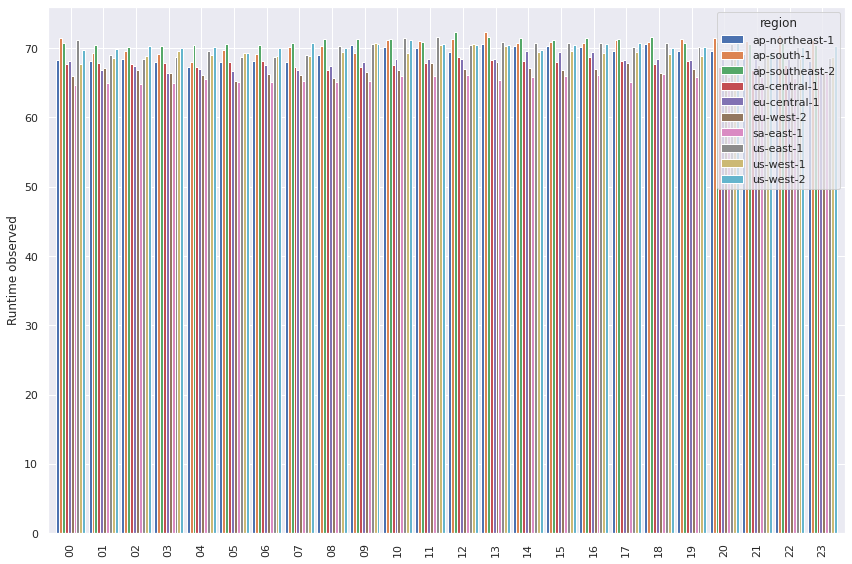

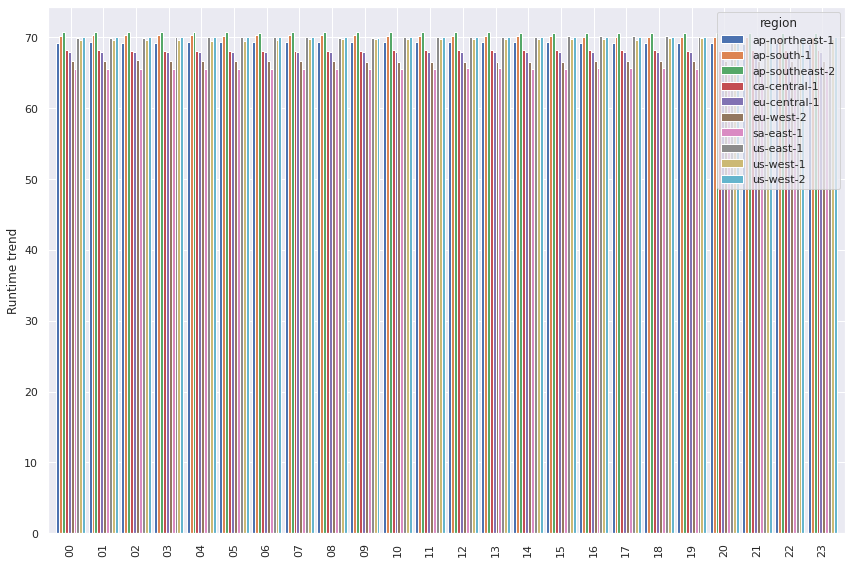

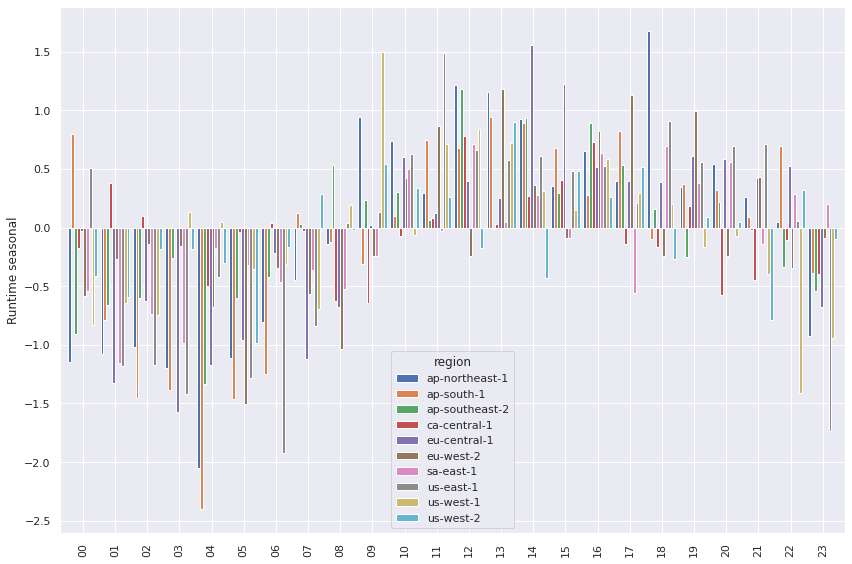

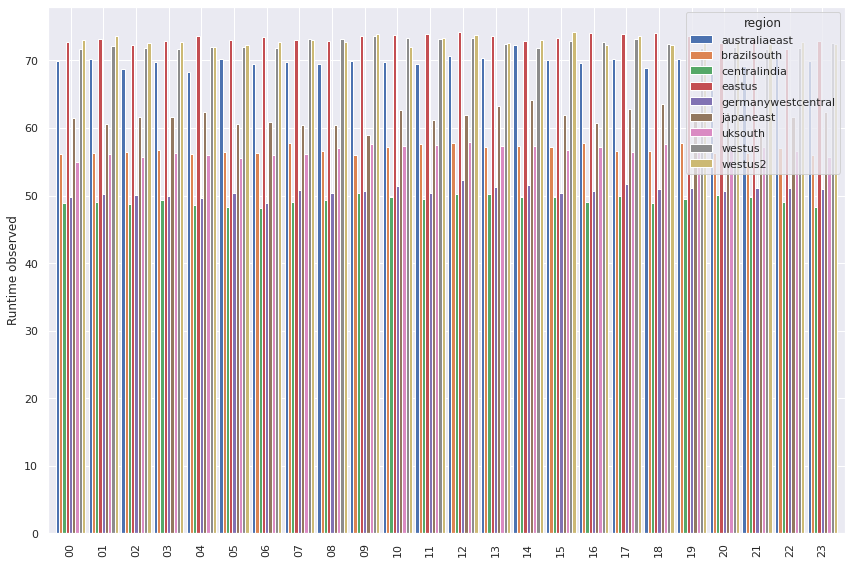

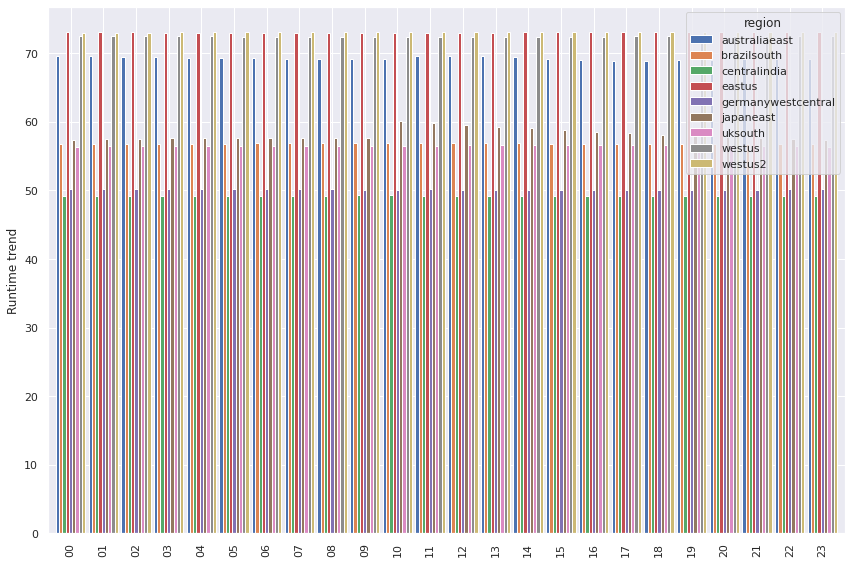

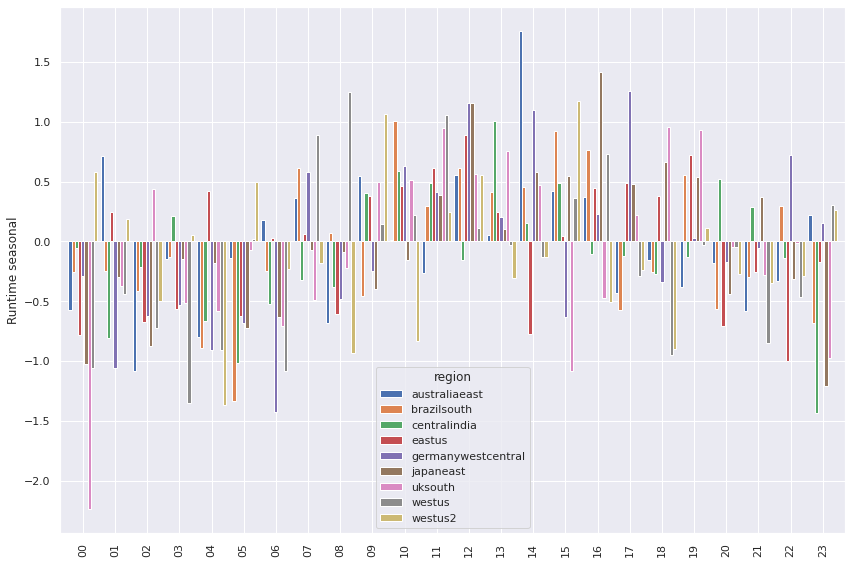

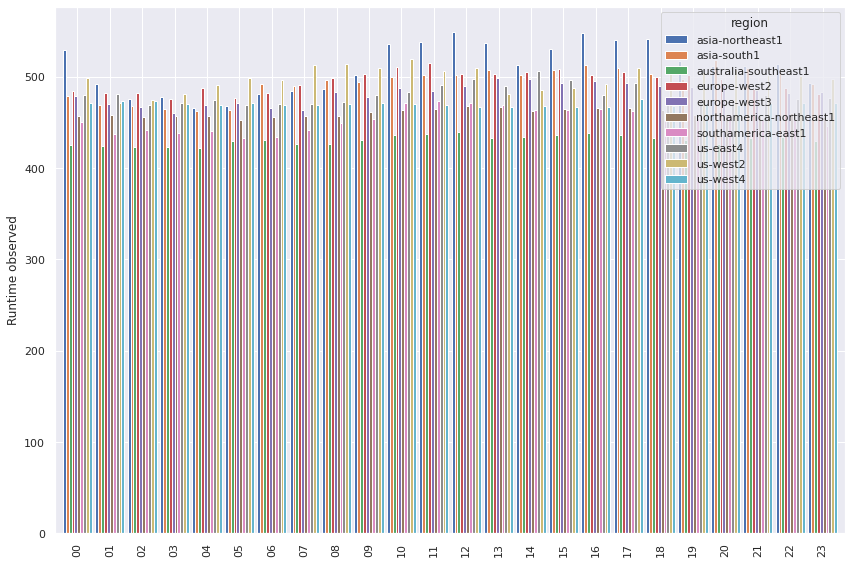

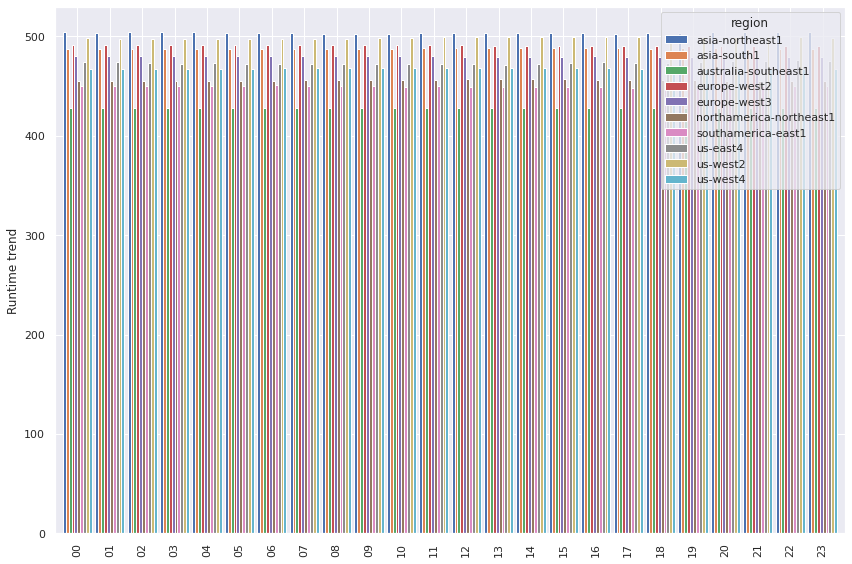

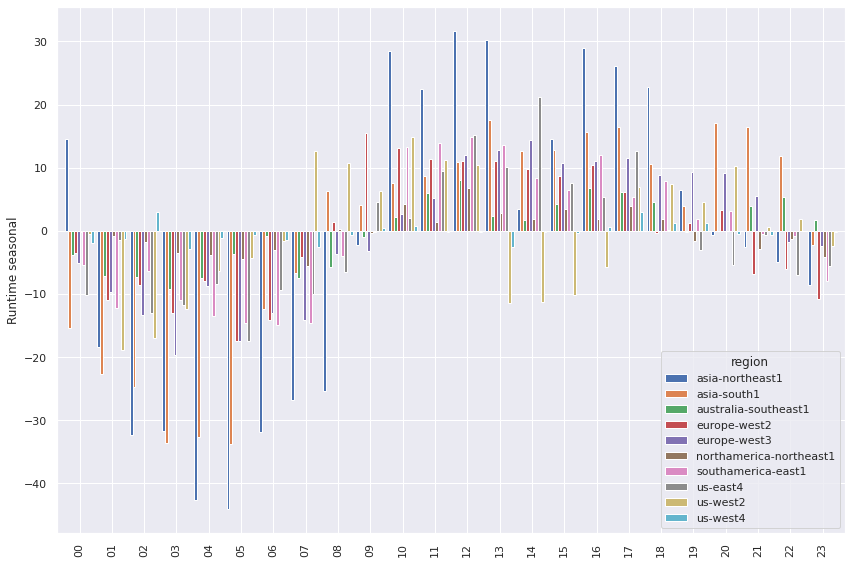

In [38]:
providers = ['AWS', 'AZURE', 'GCP']
cols = ['observed', 'trend', 'seasonal']

for provider in providers:
    provider_decomposes = list(filter(lambda decomp: decomp['parameters']['provider'] == provider, decomp_hourly))
    
    num_regions = len(provider_decomposes)
    
    for col in cols:
        fig, axis = plt.subplots(figsize=(12,8), sharey=False, sharex=True, nrows = 1, ncols=1)
        from itertools import chain
        # axis = list(chain.from_iterable(axis))

        #cax = 0
        fdf = None
        for decomp in provider_decomposes:
            timezone = decomp['parameters']['timezone']
            if col == 'observed':
                series = getattr(decomp['decomposition']['data'], col)['runtime'].rename(col)
                series = series.astype(np.float64) #TODO: check if fix neccesary for vio (box not)
            else:
                series = getattr(decomp['decomposition']['data'], col).rename(col)
            
            ddf = pd.DataFrame(series)
            ddf.set_index(pd.DatetimeIndex(ddf.index), drop=False, inplace=False)
            ddf['hist'] = ddf.index.tz_localize('UTC').tz_convert(timezone).strftime("%H")
            ddf['region'] = decomp['parameters']['region']
    
            if fdf is None:
                fdf = ddf
            else:
                fdf = fdf.append(ddf)
        plotdf = fdf.groupby(['region', 'hist']).median()
        plotdf = plotdf.reset_index()
        
        # print(plotdf)
        pivotdf = plotdf.reset_index().pivot(index='hist', columns='region', values=col)
        pivotdf.plot.bar(ax=axis, width=0.9)
        
        axis.set_ylabel(f'Runtime {col}')
        axis.set_xlabel('')
        
        fig.tight_layout()
        utils.savefig(fig, ['temporal_analysis', 'summary', provider, f'{col}_runtime_hourly_overview_bar'])

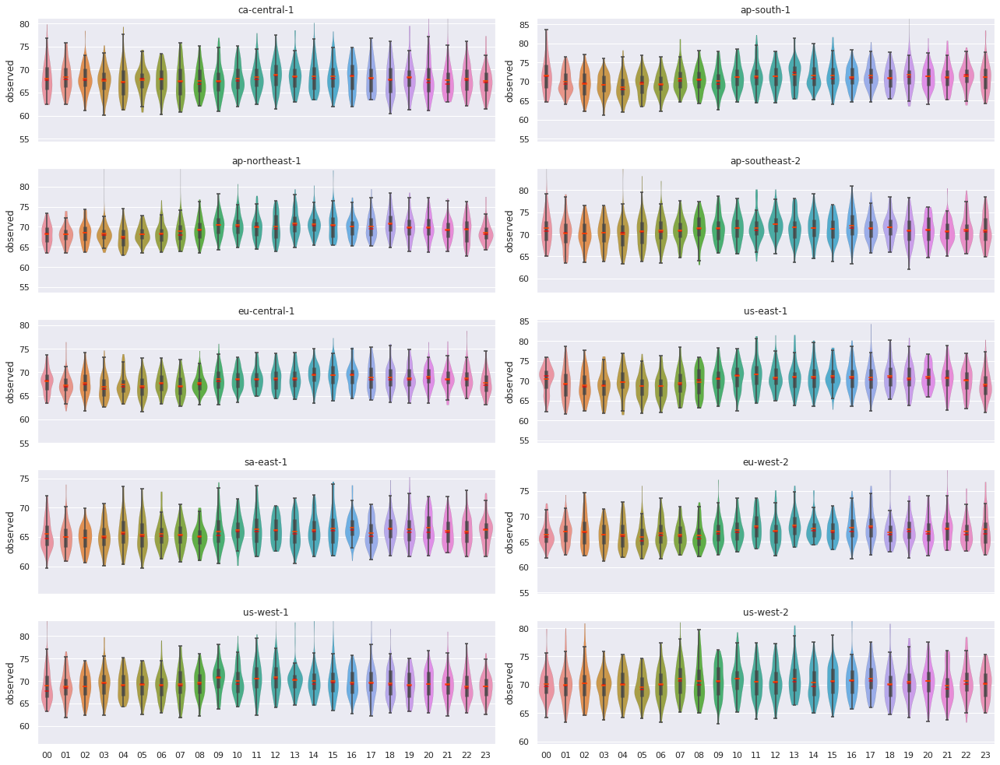

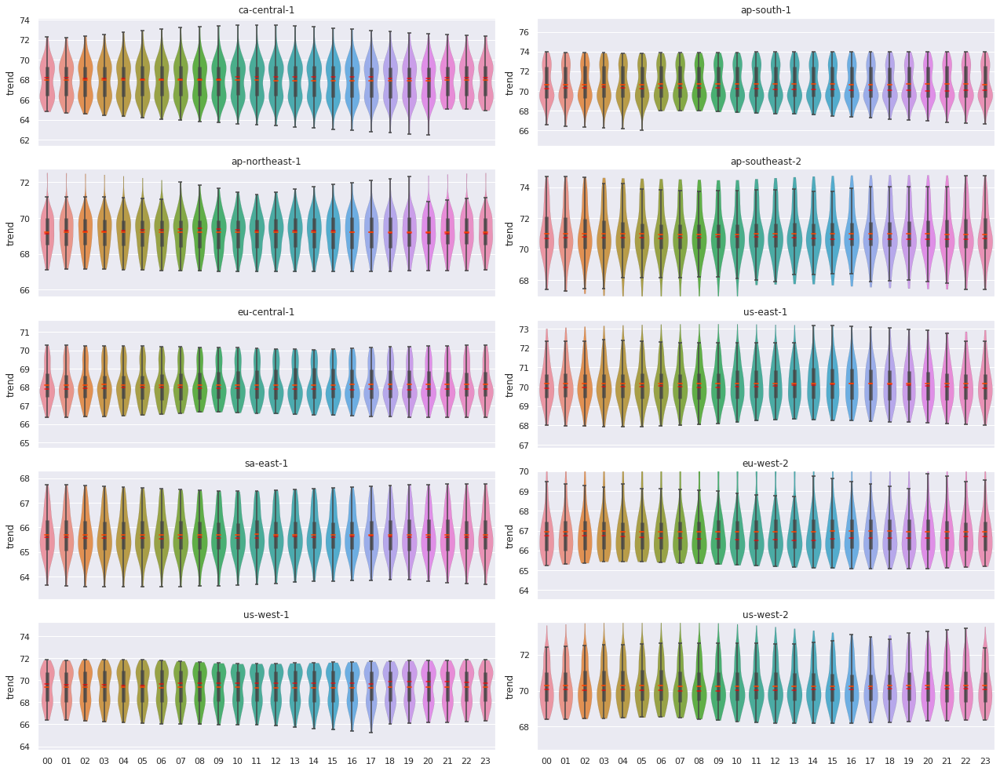

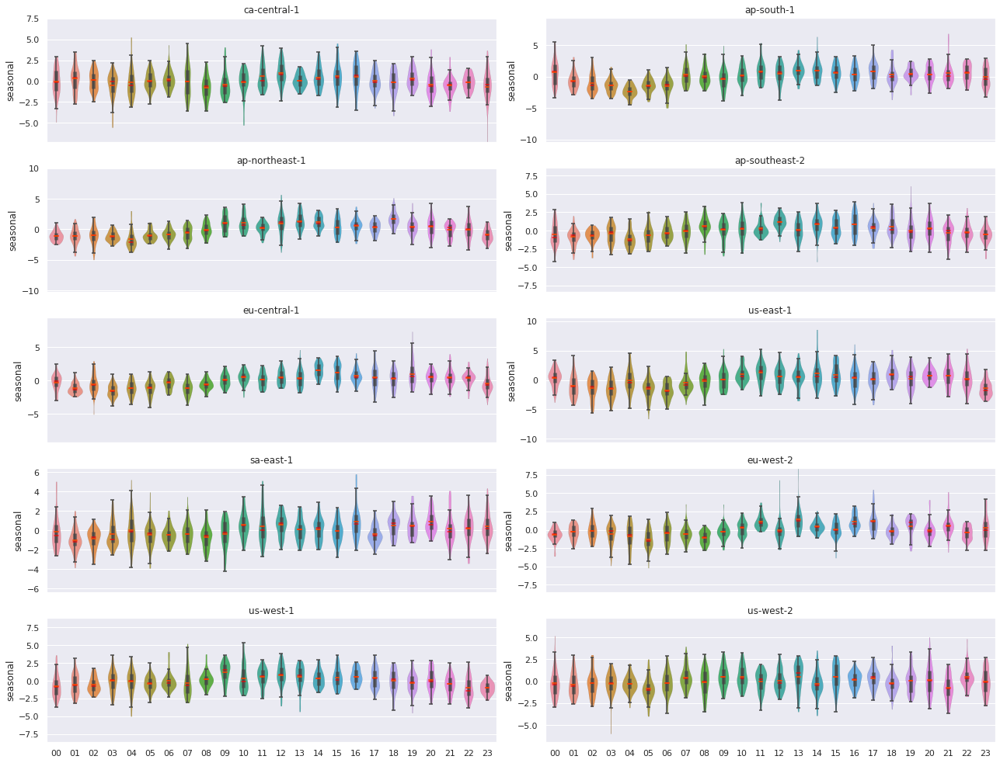

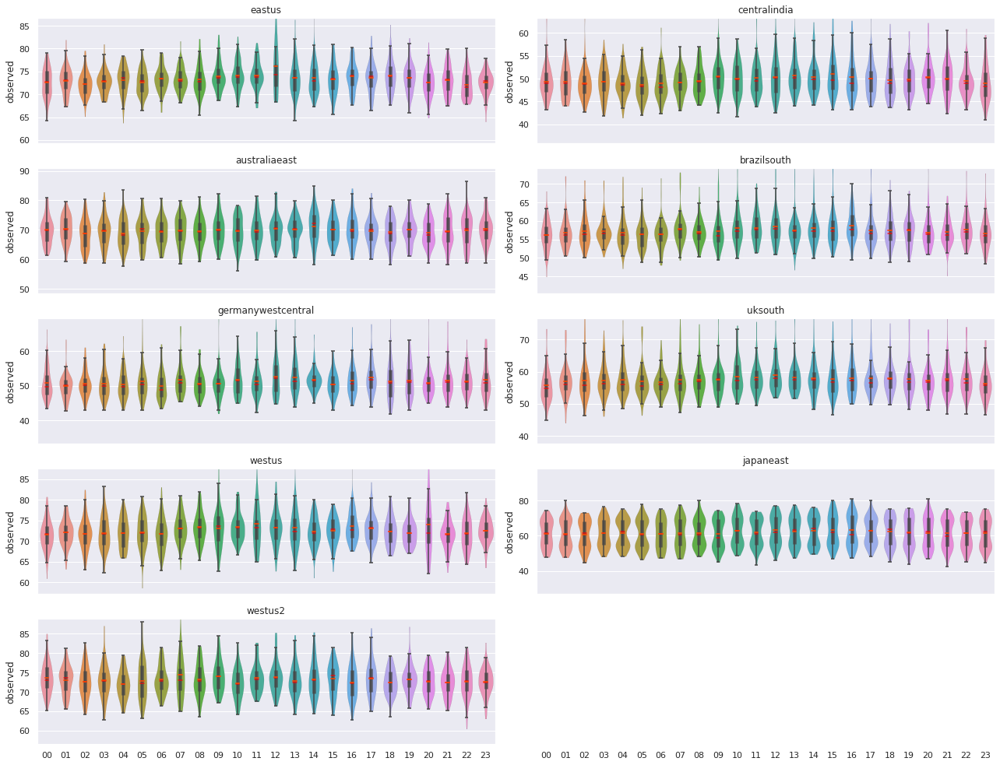

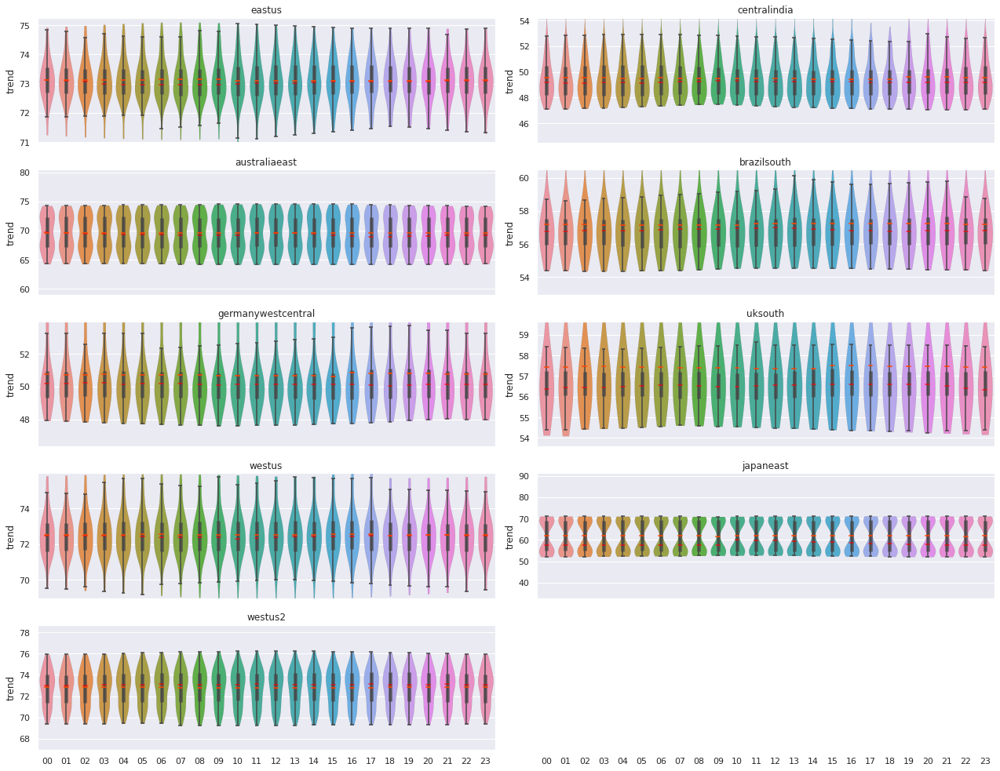

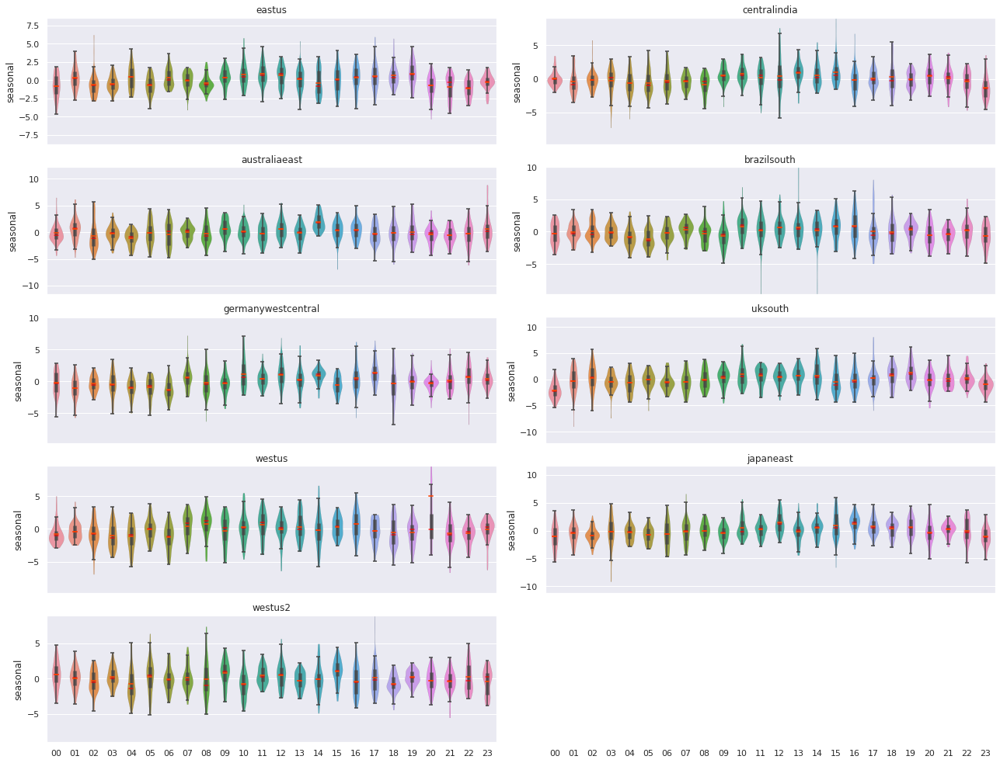

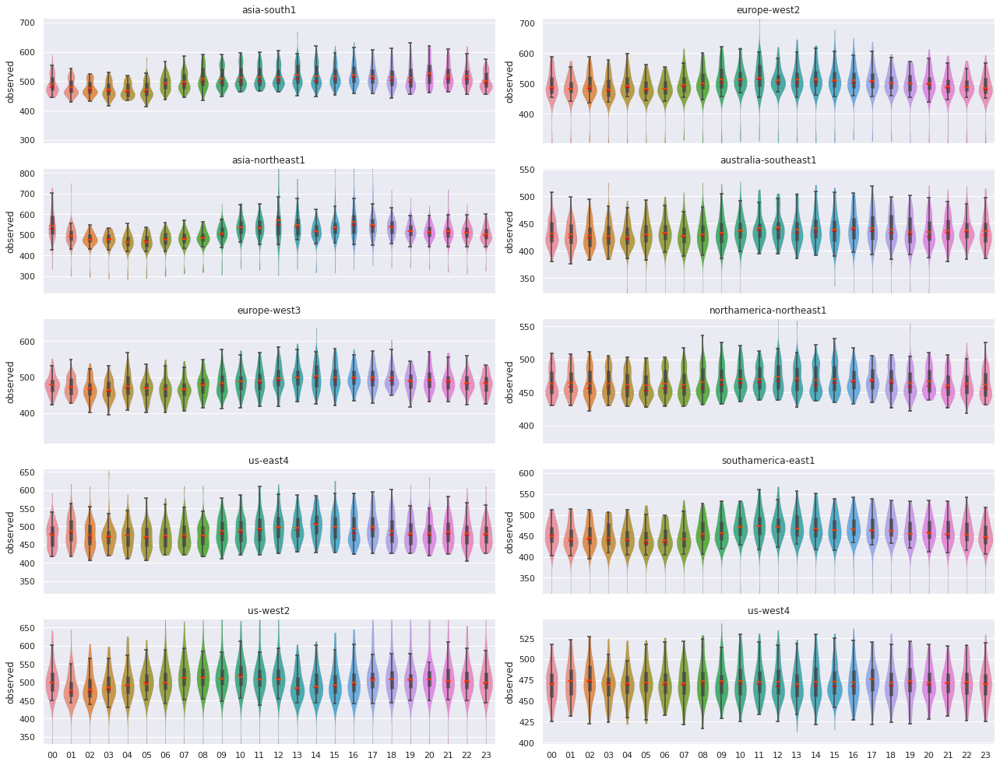

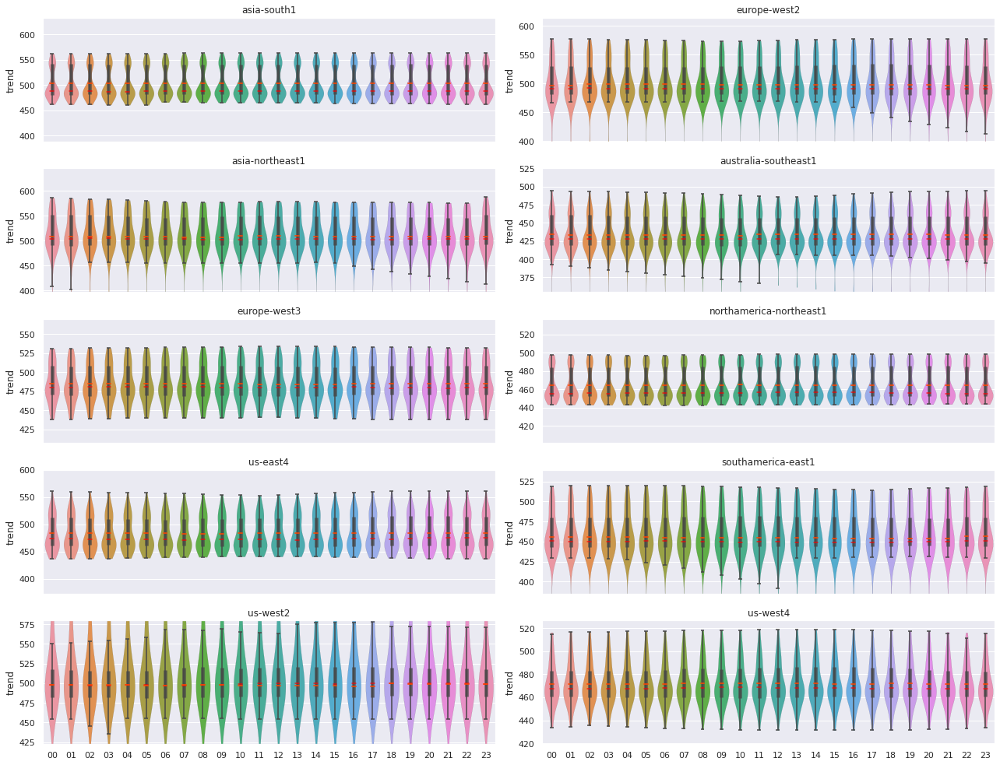

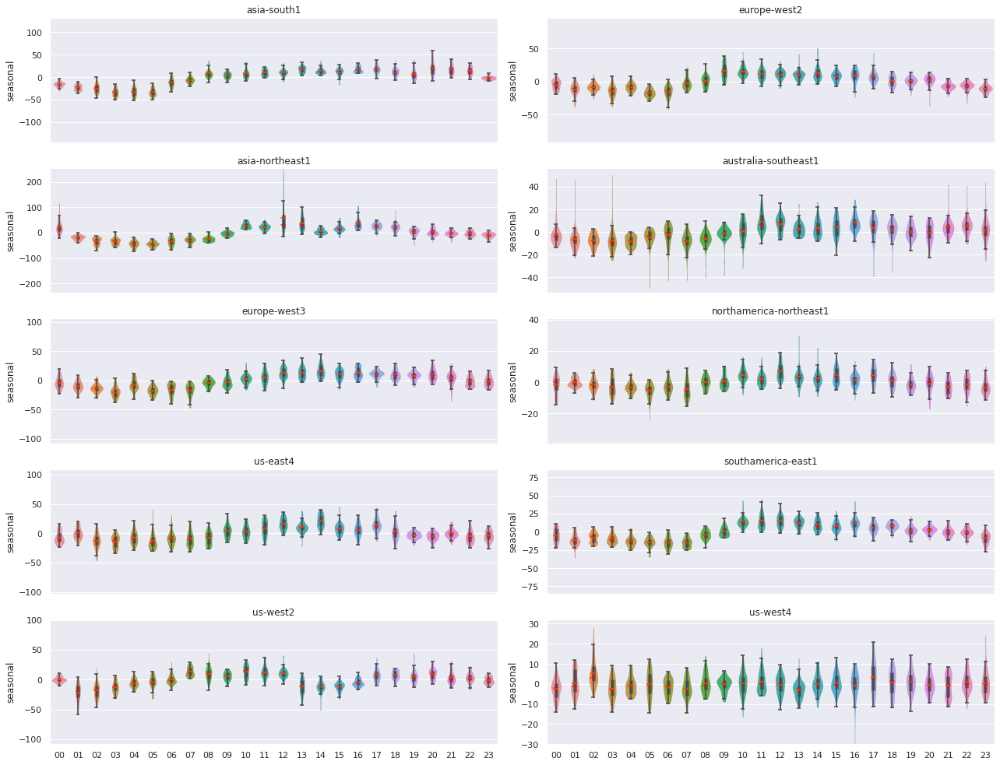

In [39]:
providers = ['AWS', 'AZURE', 'GCP']
cols = ['observed', 'trend', 'seasonal']

for provider in providers:
    provider_decomposes = list(filter(lambda decomp: decomp['parameters']['provider'] == provider, decomp_hourly))
    for col in cols:
        fig, axis = plt.subplots(figsize=(18,14), sharey=False, sharex=True, nrows = 5, ncols=2)
        from itertools import chain
        axis = list(chain.from_iterable(axis))

        cax = 0
        viodata = {}
        for decomp in provider_decomposes:
            viodata[decomp['parameters']['region']] = violinplot_hourly([decomp], axis[cax], decomp['parameters']['region'], col)
            cax += 1
        if provider == 'AZURE':
            axis[9].set_facecolor('none')
            axis[9].set_yticks([])
            
        fig.suptitle('')
        fig.tight_layout()
        utils.savefig(fig, ['temporal_analysis', 'summary', provider, f'{col}_runtime_hourly_violin'], viodata=dict_to_str(viodata))

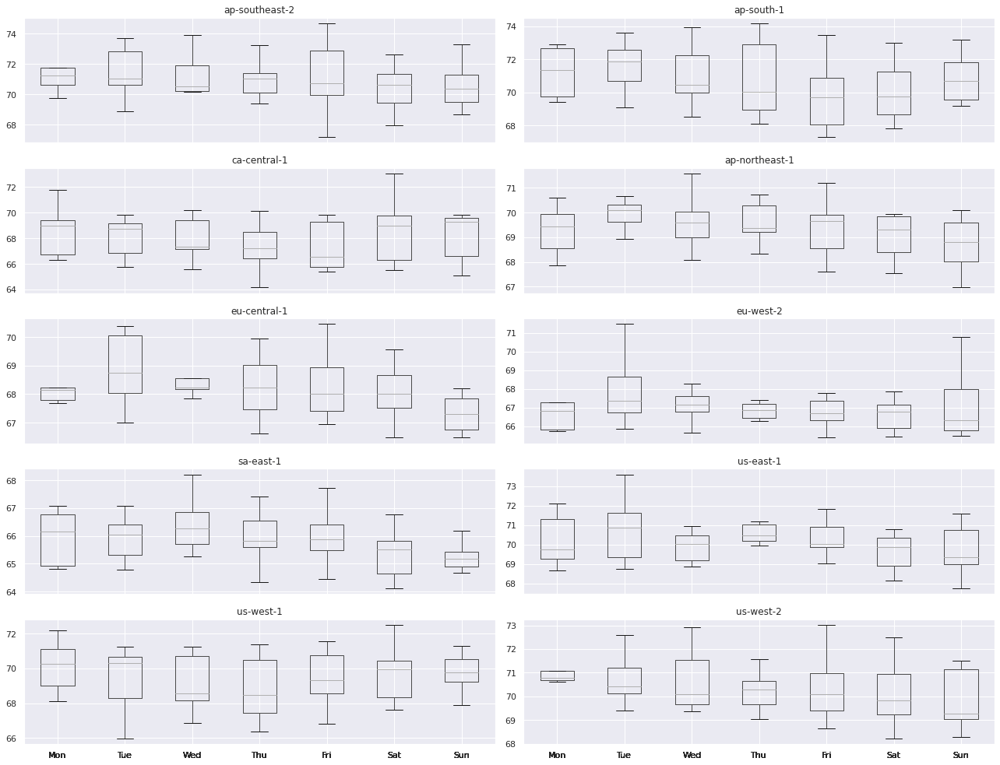

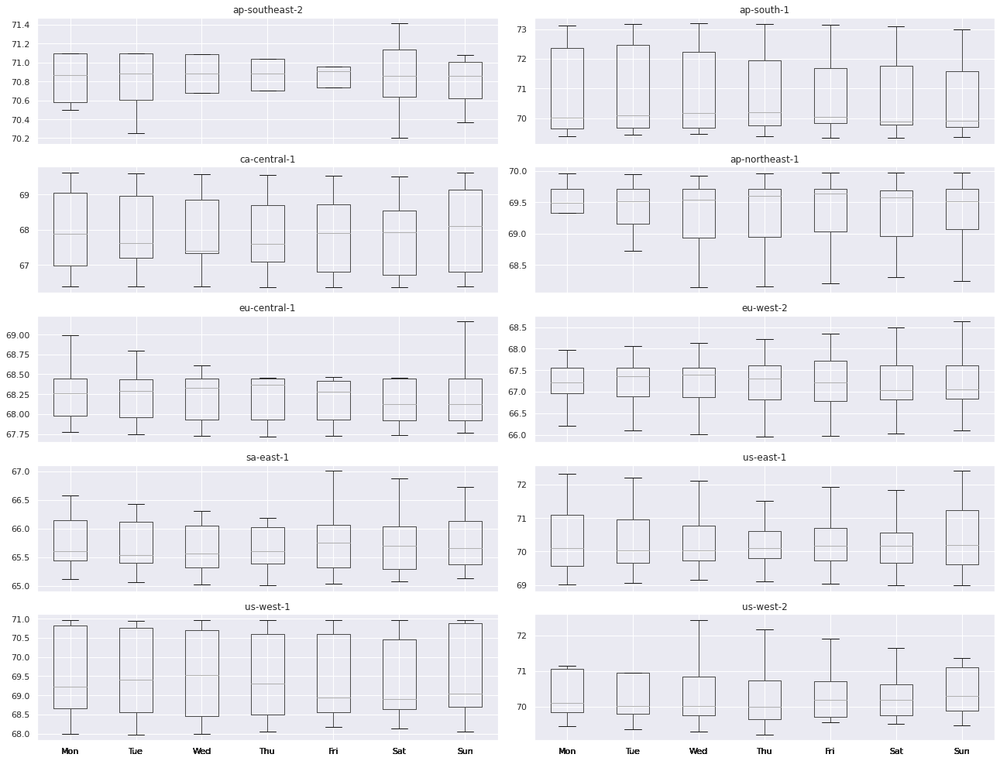

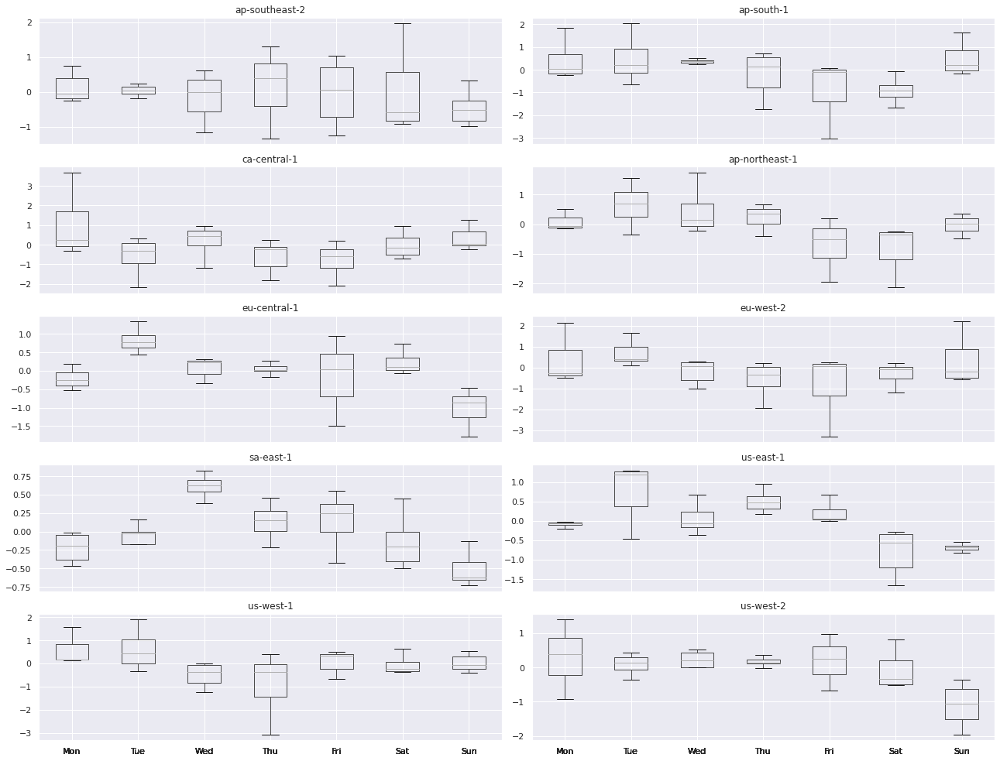

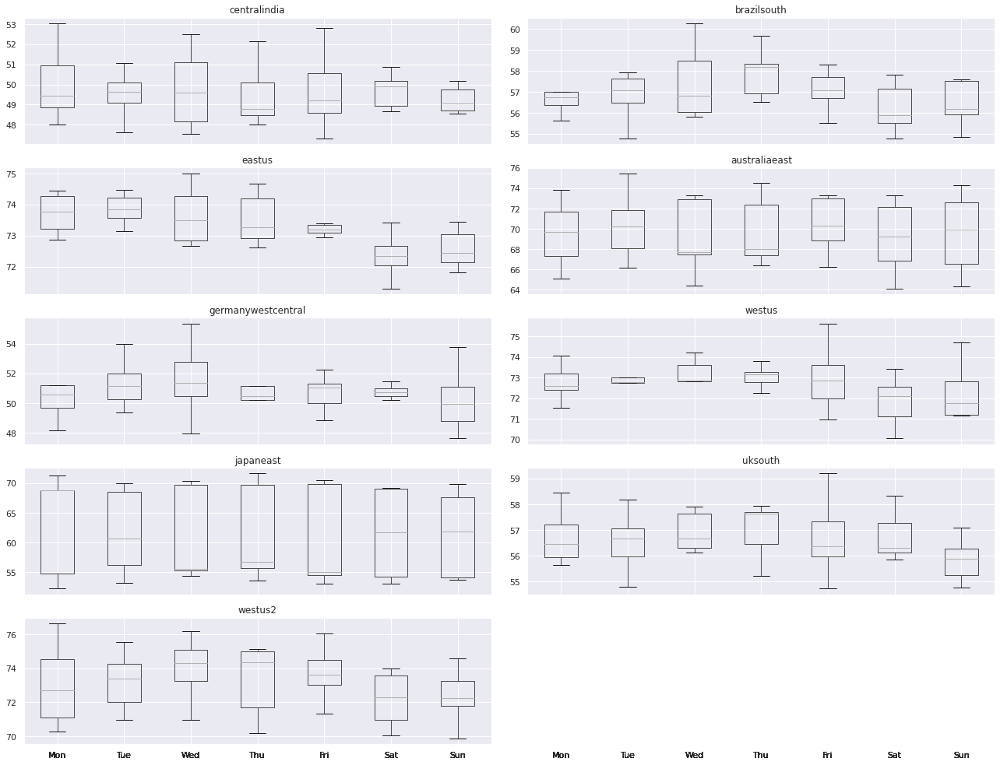

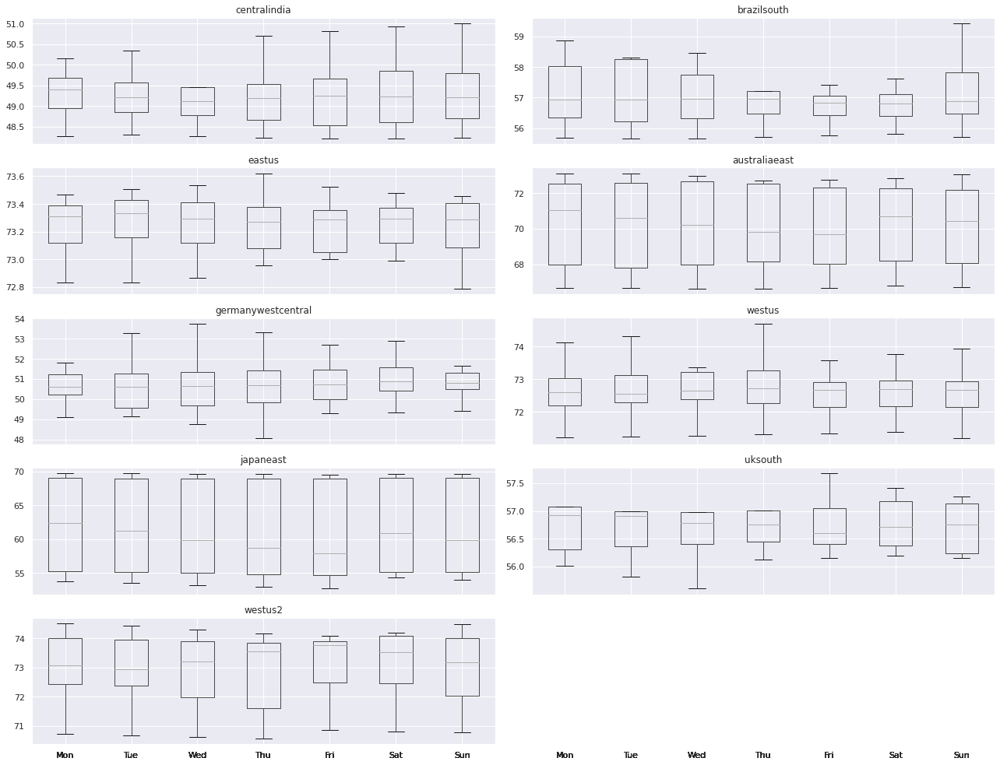

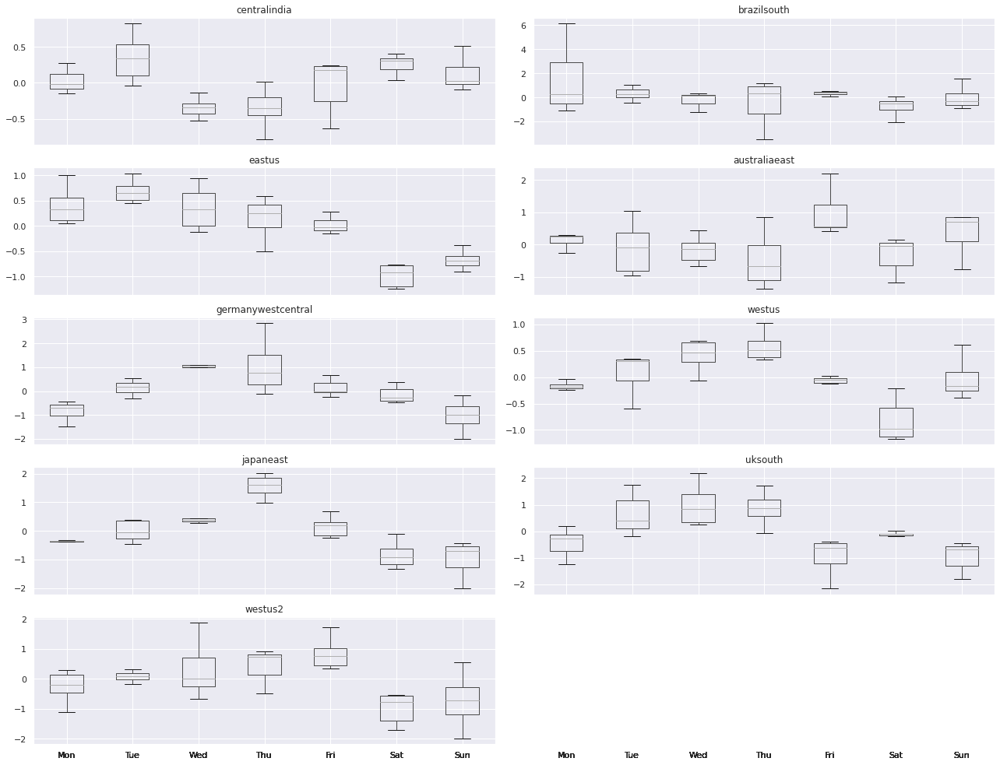

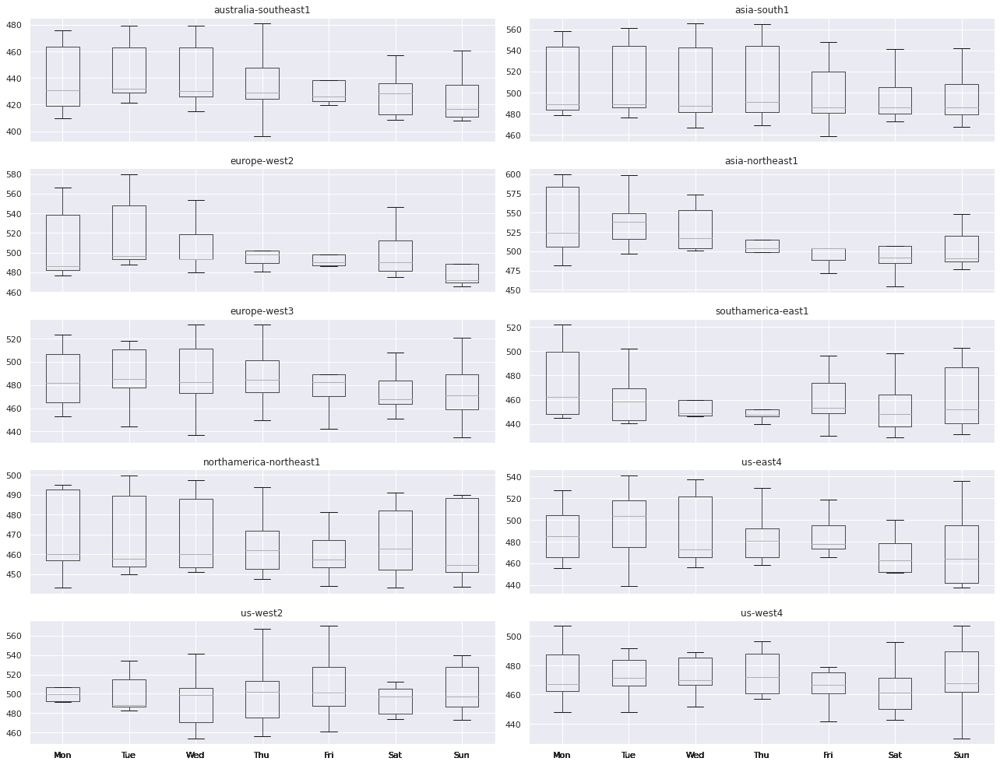

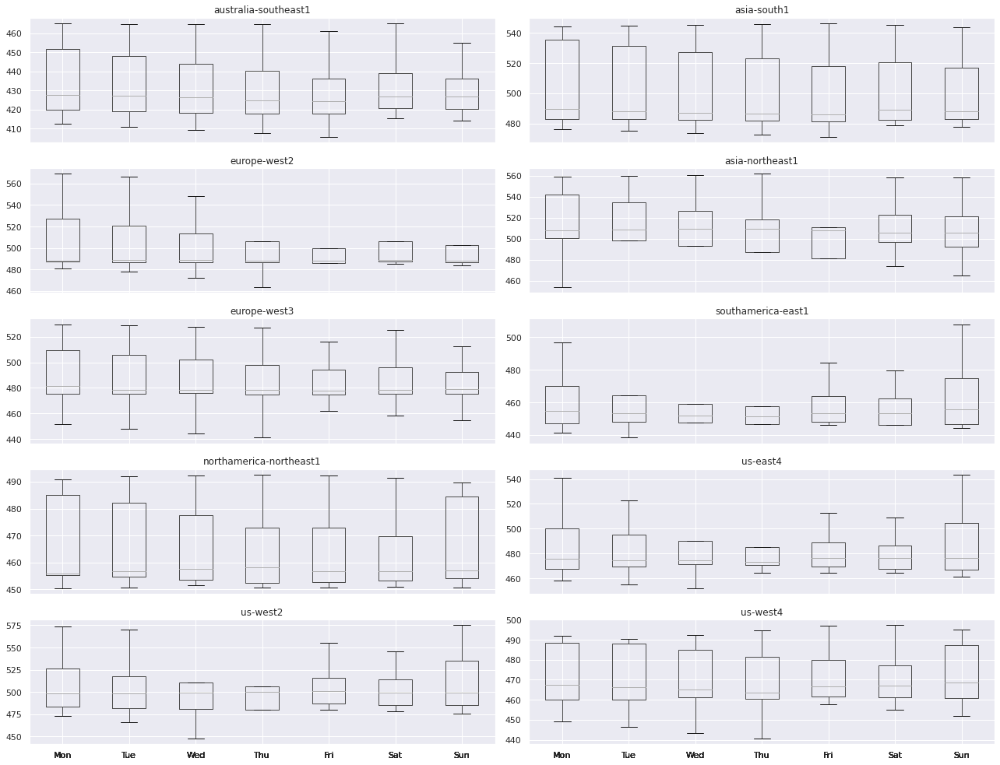

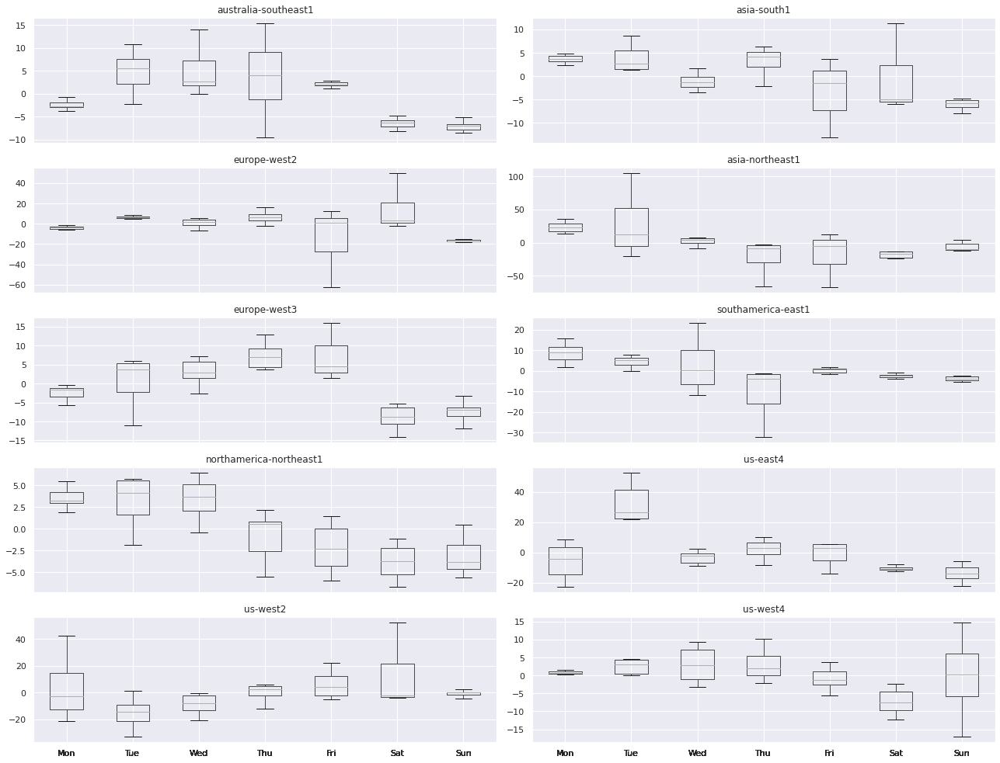

In [40]:
providers = ['AWS', 'AZURE', 'GCP']
cols = ['observed', 'trend', 'seasonal']

for provider in providers:
    provider_decomposes = list(filter(lambda decomp: decomp['parameters']['provider'] == provider, decomp_daily))
    
    num_regions = len(provider_decomposes)
    
    for col in cols:
        fig, axis = plt.subplots(figsize=(18,14), sharey=False, sharex=True, nrows = 5, ncols=2)
        from itertools import chain
        axis = list(chain.from_iterable(axis))

        cax = 0
        bxpdata = {}
        for decomp in provider_decomposes:
            bxpdata[decomp['parameters']['region']] = boxplot_daily([decomp], axis[cax], decomp['parameters']['region'], col)
            cax += 1
        if provider == 'AZURE':
            axis[9].set_facecolor('none')
            axis[9].set_yticks([])
        
        axis[9].set_xticklabels(num_regions*['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])
        fig.suptitle('')
        fig.tight_layout()
        utils.savefig(fig, ['temporal_analysis', 'summary', provider, f'{col}_runtime_daily'], bxpdata=dict_to_str(bxpdata))

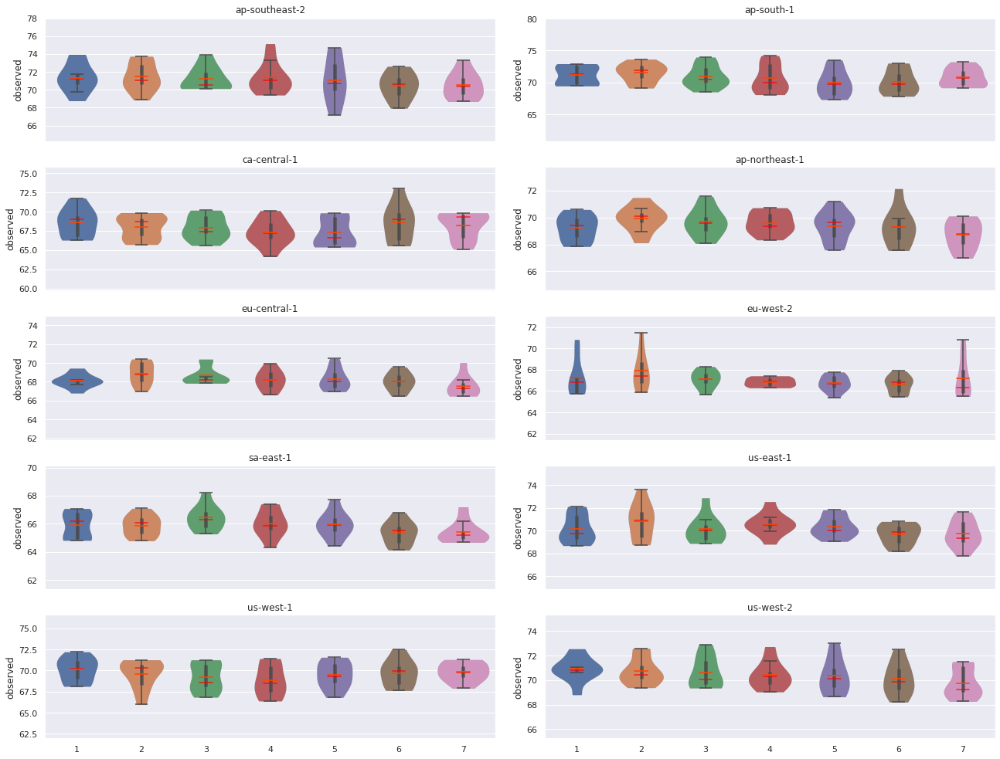

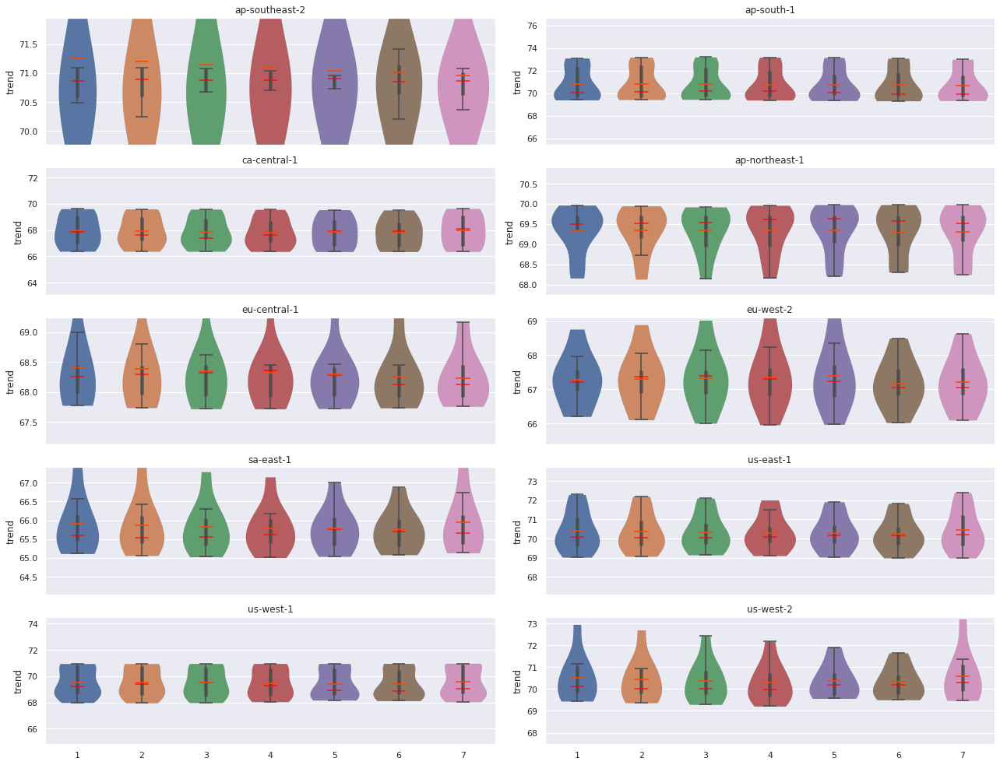

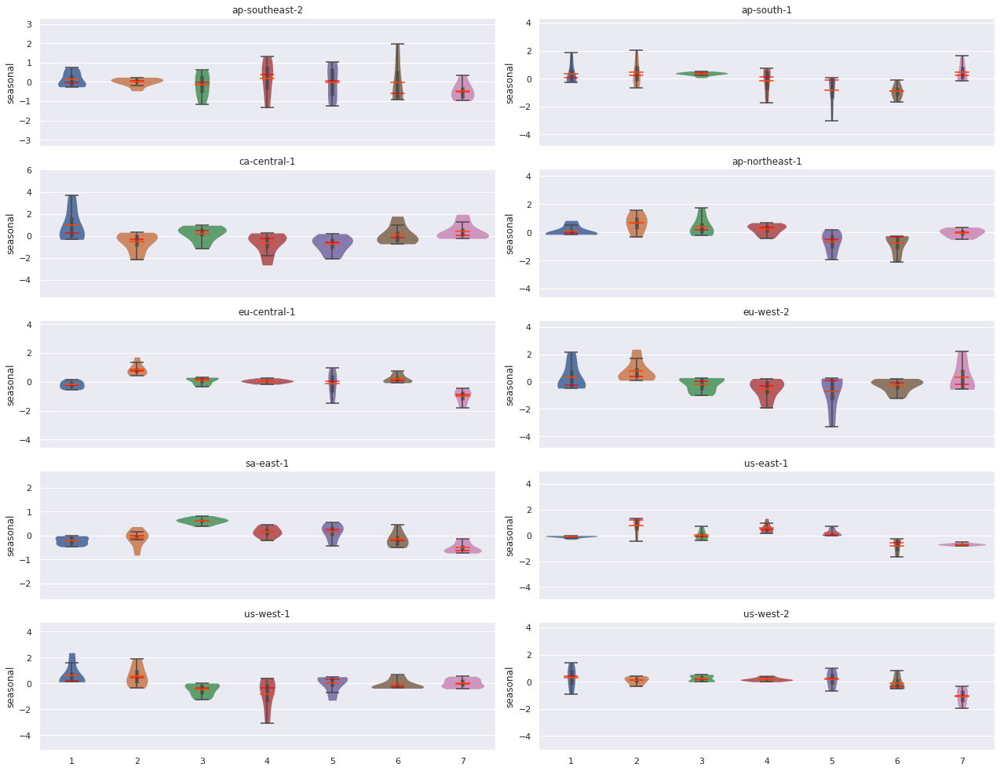

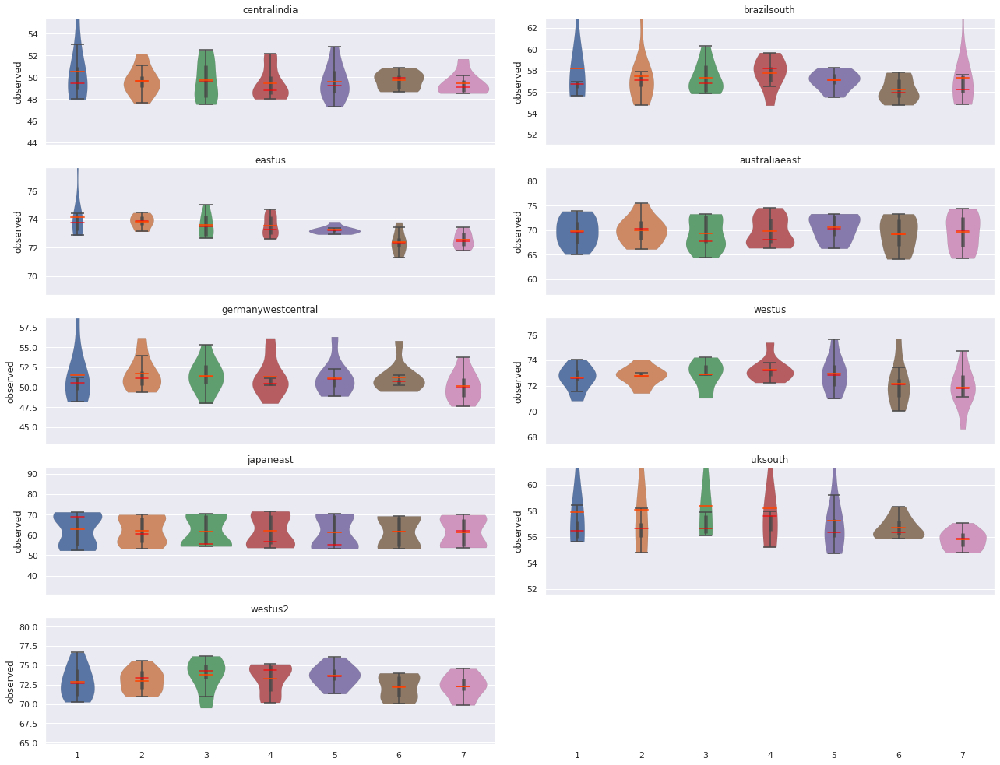

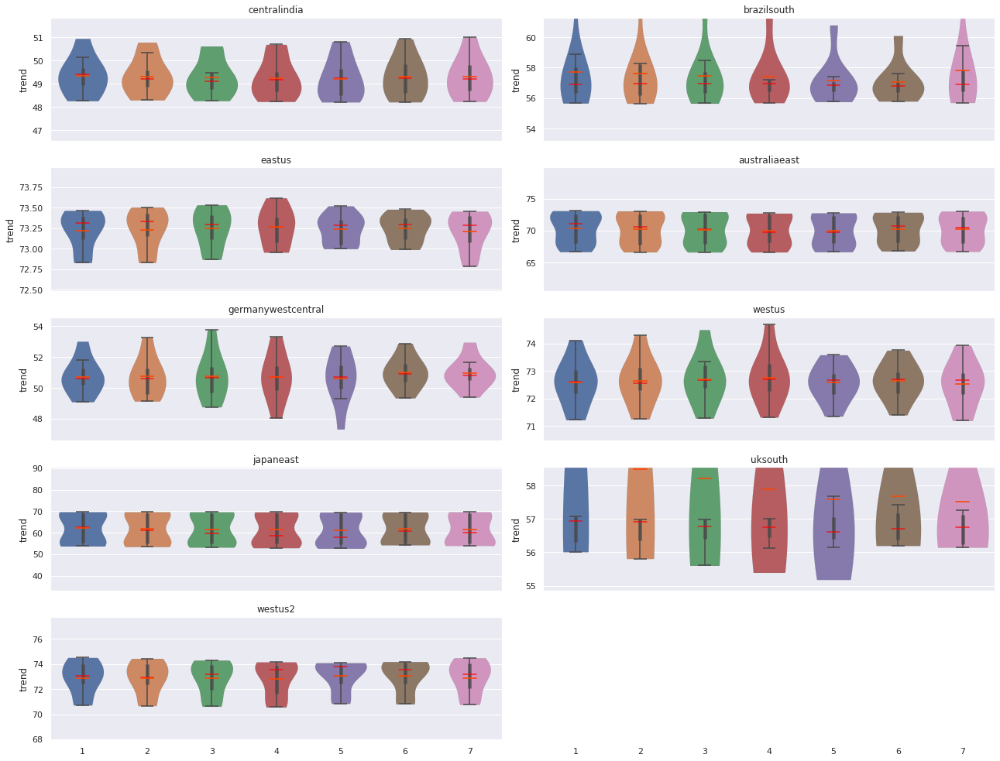

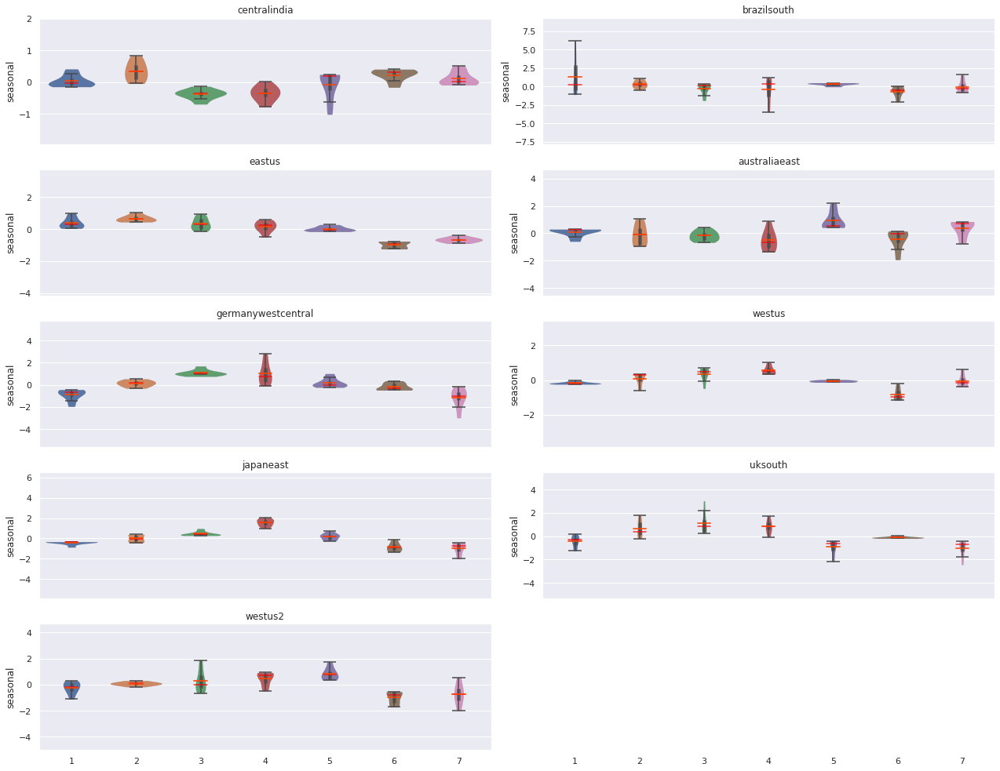

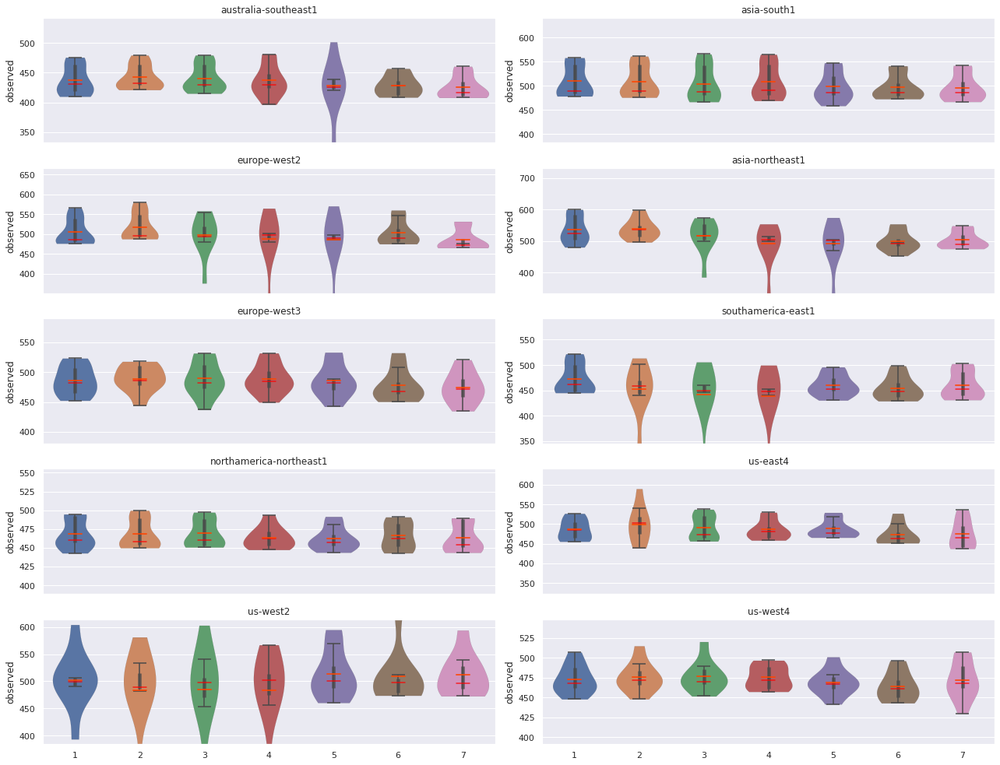

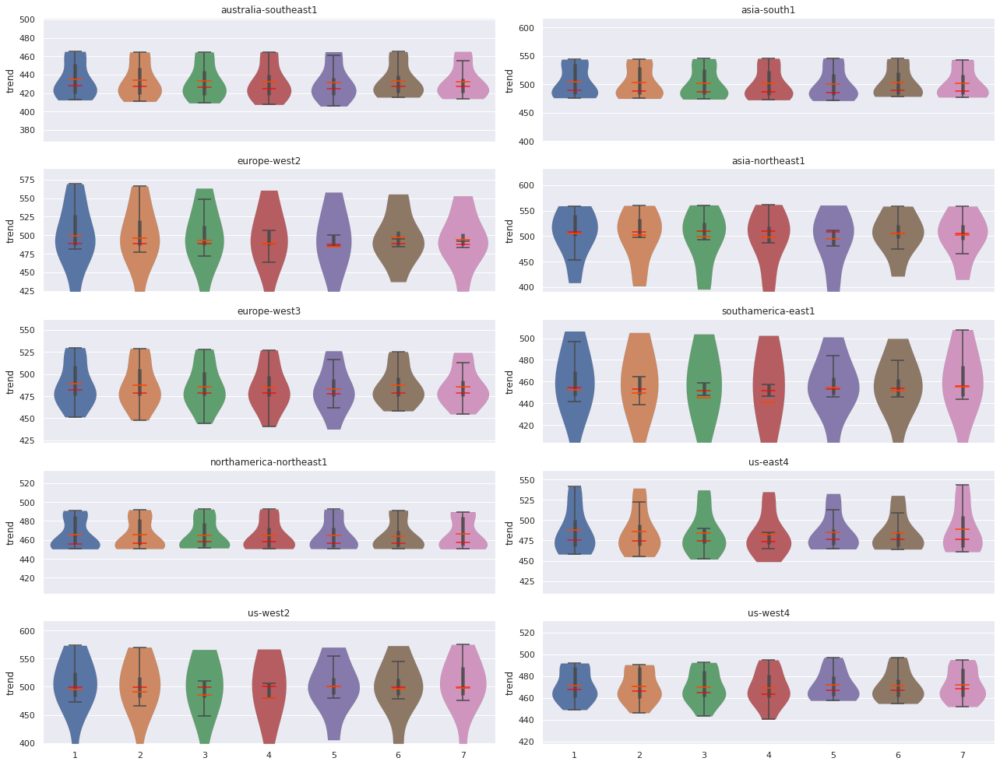

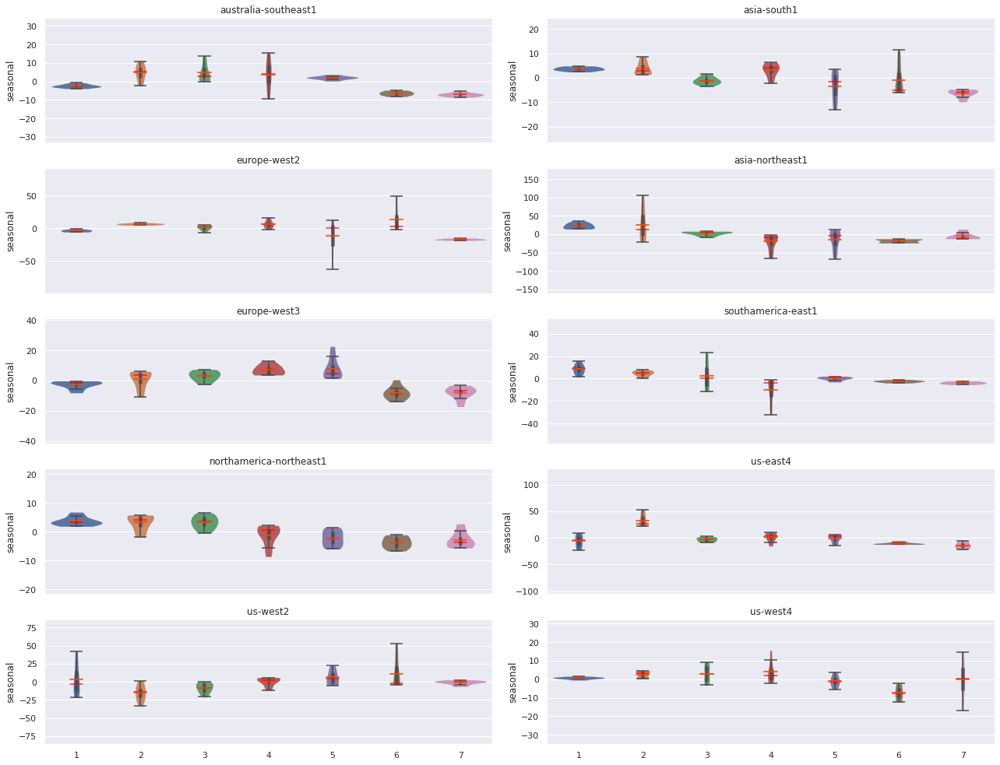

In [41]:
providers = ['AWS', 'AZURE', 'GCP']
cols = ['observed', 'trend', 'seasonal']

for provider in providers:
    provider_decomposes = list(filter(lambda decomp: decomp['parameters']['provider'] == provider, decomp_daily))
    for col in cols:
        fig, axis = plt.subplots(figsize=(18,14), sharey=False, sharex=True, nrows = 5, ncols=2)
        from itertools import chain
        axis = list(chain.from_iterable(axis))

        cax = 0
        viodata = {}
        for decomp in provider_decomposes:
            viodata[decomp['parameters']['region']] = violinplot_daily([decomp], axis[cax], decomp['parameters']['region'], col)
            cax += 1
        if provider == 'AZURE':
            axis[9].set_facecolor('none')
            axis[9].set_yticks([])
        
        fig.suptitle('')
        fig.tight_layout()
        utils.savefig(fig, ['temporal_analysis', 'summary', provider, f'{col}_runtime_daily_violin'], viodata=dict_to_str(viodata))

In [42]:
def output_casetable(casetab):
    output = ""

    # output += r'\begin{table}[]\begin{tabular}{lll} &  &  \\ &  &  \\ &  & \end{tabular}\end{table}'
    output += r'\begin{table}[h]\begin{tabular}{ll|cccc||cccc} '+ "\n"
    output += r' Provider & Region & \multicolumn{4}{c||}{Case Hourly} & \multicolumn{4}{c}{Case Daily} \\' + "\n"
    output += r'          &        & 1 & 2 & 3 & 4 & 1 & 2 & 3 & 4  \\' + "\n"
    for provider, regions in casetab.items():
        grp = provider
        
        for region, cases in regions.items():
            # print(provider, region, cases['hourly'], cases['daily'])
            hourly_case_1 = ""
            if cases['hourly'] == "case_1":
                hourly_case_1 = "X"
            hourly_case_2 = ""
            if cases['hourly'] == "case_2":
                hourly_case_2 = "X"
            hourly_case_3 = ""
            if cases['hourly'] == "case_3":
                hourly_case_3 = "X"
            hourly_case_4 = ""
            if cases['hourly'] == "case_4":
                hourly_case_4 = "X"
            
            
            daily_case_1 = ""
            if cases['daily'] == "case_1":
                daily_case_1 = "X"
            daily_case_2 = ""
            if cases['daily'] == "case_2":
                daily_case_2 = "X"
            daily_case_3 = ""
            if cases['daily'] == "case_3":
                daily_case_3 = "X"
            daily_case_4 = ""
            if cases['daily'] == "case_4":
                daily_case_4 = "X"
            
            line = ""
            line += f' {grp} & {region} & {hourly_case_1} & {hourly_case_2} & {hourly_case_3} & {hourly_case_4}'
            line += f' &'
            line += f' {daily_case_1} & {daily_case_2} & {daily_case_3} & {daily_case_4} \\\\'
            line += "\n"
            
            grp = ""
            output += line
        
    output += r'\end{tabular}\end{table}'
    return output
# Latex(output_casetable(casetab))

In [43]:
def create_casetab(hourly, daily):
    casetab = {}
    # Go Over Hourly
    for result in hourly:
        provider = result['parameters']['provider']
        region = result['parameters']['region']

        if provider not in casetab.keys():
            casetab[provider] = {}
        if region not in casetab[provider].keys():
            casetab[provider][region] = {}
            
        casetab[provider][region]['hourly'] = result['stats_test']['case']
    # Go Over Hourly
    for result in daily:
        provider = result['parameters']['provider']
        region = result['parameters']['region']

        if provider not in casetab.keys():
            casetab[provider] = {}
        if region not in casetab[provider].keys():
            casetab[provider][region] = {}

        casetab[provider][region]['daily'] = result['stats_test']['case']
    return casetab  

In [44]:
casetab = create_casetab(decomp_hourly, decomp_daily)
output = output_casetable(casetab)
Latex(output)

<IPython.core.display.Latex object>

In [45]:
def create_casedf(data):
    data_dict = {'provider': [], 'region': [], 'case': []}
    
    # Go Over Hourly
    for result in data:
        provider = result['parameters']['provider']
        region = result['parameters']['region']
        data_dict['provider'].append(provider)
        data_dict['region'].append(region)
        data_dict['case'].append(int(result['stats_test']['case'].split('_')[1]))
        # TODO: Can add p value?
        # data_dict['data'].append(result['stats_test']['case'])
    df = pd.DataFrame(data_dict)
    df['Cloud Region'] = df['provider'] + ' ' + df['region']
    df = df.set_index('Cloud Region')
    return df['case']

hourly_casedf = create_casedf(decomp_hourly).rename('Hour Of Day')
daily_casedf = create_casedf(decomp_daily).rename('Day Of Week')
casedf = pd.merge(hourly_casedf, daily_casedf, right_index=True, left_index=True)

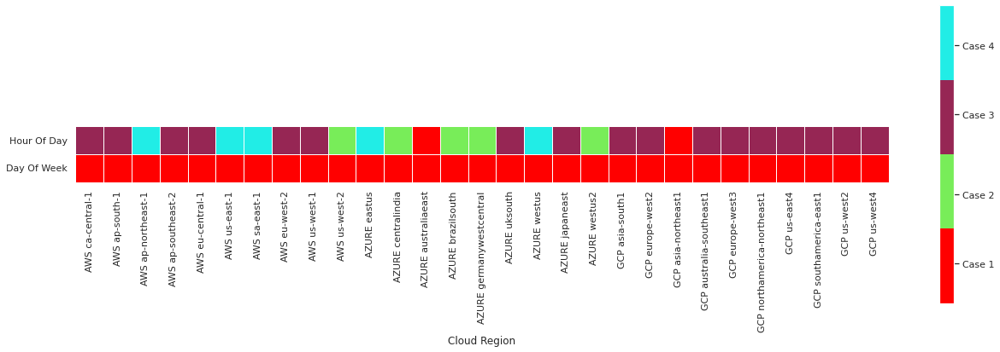

In [46]:
fig, ax = plt.subplots(figsize=(18,6))

my_colors=[(1,0,0), (0.47,0.93,0.35), (0.59,0.15,0.33), (0.13,0.93,0.9)]
ax = sns.heatmap(casedf.transpose(), ax=ax, cmap=my_colors, linewidth=1, linecolor='w', square=True, cbar=False)

colorbar = ax.figure.colorbar(ax.collections[0])
colorbar.set_ticks([1.4,2.1,2.9,3.6])
colorbar.set_ticklabels(['Case 1','Case 2','Case 3', 'Case 4'])
fig.tight_layout()

utils.savefig(fig, ['temporal_analysis', 'stattest', 'heatmap'])